# structure


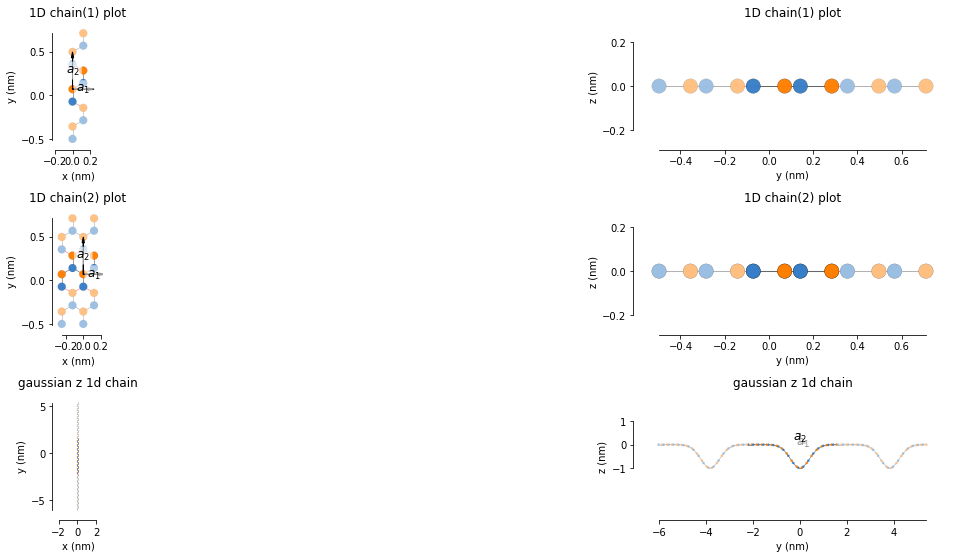

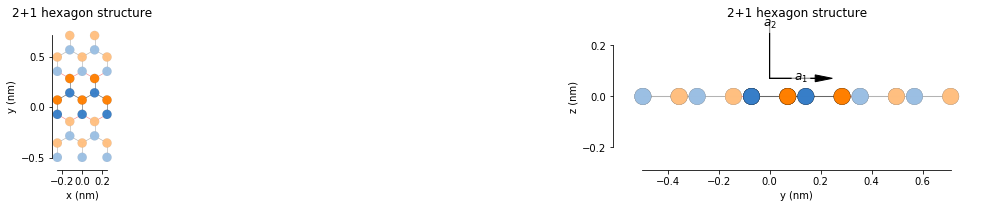

In [141]:
import numpy as np
import matplotlib.pyplot as plt
import pybinding as pb
from pybinding.repository import graphene
plt.rcParams["figure.figsize"] = (20,5)
#potential or junction part
def pnjunctiony(delta, y0):
    @pb.onsite_energy_modifier
    def potential(energy,y):
        energy[y<y0]+=delta
        energy[y>=y0]-=delta
        return energy
    return potential


def pnjunctionx(delta, x0):
    @pb.onsite_energy_modifier
    def potential(energy,x):
        energy[x<x0]+=delta
        energy[x>=x0]-=delta
        return energy
    return potential

def potentialwell(A,xc,x0,yc,y0,b):
    @pb.onsite_energy_modifier
    def potential(energy,x,y):
        energy=A*(xc*(x-x0)**2+yc*(y-y0)**2-b)
        return energy
    return potential
    
def tanhx(E,x0,w):
    @pb.onsite_energy_modifier
    def potential(energy,x):
        energy=E*(np.exp(w*(x-x0))-np.exp(-w*(x-x0)))/(np.exp(w*(x-x0))+np.exp(-w*(x-x0)))
        return energy
    return potential
def tanhmiddle(E,y0,w,A):
    @pb.onsite_energy_modifier
    def potential(energy,y):
        energy=E*(np.exp(A*(np.abs(y-y0)-w/2))-np.exp(-A*(np.abs(y-y0)-w/2)))/(np.exp(A*(np.abs(y-y0)-w/2))+np.exp(-A*(np.abs(y-y0)-w/2)))
        return energy
    return potential
    
    
def gaussiany(E,y0,width):
    @pb.onsite_energy_modifier
    def potential(energy,y):
        energy=2*E*(np.exp(-((y-y0)**2)/(2*(width/2)**2))-0.5)
        return energy
    return potential

def gaussianx(E,x0,width):
    @pb.onsite_energy_modifier
    def potential(energy,x):
        energy=2*E*(np.exp(-((x-x0)**2)/(2*(width/2)**2))-0.5)
        return energy
    return potential


def gaussianwell(E,x0,y0,width):
    @pb.onsite_energy_modifier
    def potential(energy,x,y):
        energy=2*E*(np.exp(-((y-y0)**2+(x-x0)**2)/(2*(width/2)**2)))
        return energy
    return potential

plt.rcParams["figure.figsize"] = (20,10)

a = graphene.a_cc * np.sqrt(3)
a_cc = graphene.a_cc
t = graphene.t
k1=[0, -np.pi/(a_cc*3)]
k2=[0 ,np.pi/(a_cc*3)]
def middle4atom(onsite=(0, 0)):
    lat = pb.Lattice(a1=[a, 0], a2=[0, 3*a_cc])

    lat.add_sublattices(('A',  [  0 ,-a_cc], onsite[0]),
                        ('B',  [  -a/2,-a_cc/2], onsite[1]))

    lat.add_aliases(('A2', 'A', [ -a/2, a_cc/2]),
                    ('B2', 'B', [ 0, a_cc]))

    lat.add_hoppings(
        # inside the unit sell
        ([0, 0], 'A',  'B',  t),
        ([0, 0], 'B',  'A2', t),
        ([0, 0], 'A2', 'B2', t),
        # between neighbouring unit cells
        ([ 0, -1], 'A', 'B2', t),
        ([-1,0],'B','A',t),
        ([ -1,0 ], 'A2', 'B2', t),

    )

    lat.min_neighbors = 2
    return lat






model1=pb.Model( graphene.monolayer_4atom()
              , pb.translational_symmetry(a1=False, a2=True)
              )
plt.subplot(421)
plt.title('1D chain(1) plot')
model1.lattice.plot_vectors(position=[0,graphene.a_cc/2])
model1.plot()
plt.subplot(422)
model1.plot(axes='yz')
plt.title('1D chain(1) plot')



model2=pb.Model( graphene.monolayer_4atom()
                ,pb.primitive(a1=2)
                ,pb.translational_symmetry(a1=False, a2=True)
              )
plt.subplot(423)
model2.plot()
plt.title('1D chain(2) plot')
model2.lattice.plot_vectors(position=[0,graphene.a_cc/2])
plt.subplot(424)
model2.plot(axes='yz')
plt.title('1D chain(2) plot')
plt.tight_layout()


def zmod(a,b,c,d):
    @pb.site_position_modifier
    def contains(x,y,z):
        z=-1*a*np.exp(-1*b*(y-c)**2)+d
        return x,y,z
    return contains

model3=pb.Model(graphene.monolayer_4atom()
                ,pb.primitive(a2=10)
                ,zmod(1,3,0,0)
                ,pb.translational_symmetry(a1=False, a2=4)
               )
plt.subplot(425)
model3.plot()
plt.title('gaussian z 1d chain')
plt.subplot(426)
model3.plot(axes='yz')
plt.title('gaussian z 1d chain')
model2.lattice.plot_vectors(position=[0,graphene.a_cc/2])
plt.show()

def translate(d):
    @pb.site_position_modifier
    def contains(x,y,z):
        x=x+d
        return x,y,z
    return contains

model3=pb.Model(graphene.monolayer_4atom()
                ,pb.rectangle(4*graphene.a_cc, 2)
                ,pb.translational_symmetry(a1=False, a2=True)
               )
plt.subplot(427)
model3.plot()
plt.title('2+1 hexagon structure')
plt.subplot(428)
model3.plot(axes='yz')
plt.title('2+1 hexagon structure')
model2.lattice.plot_vectors(position=[0,graphene.a_cc/2])

plt.tight_layout()

plt.show()

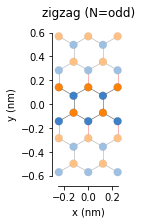

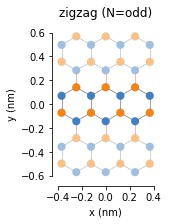

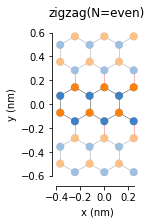

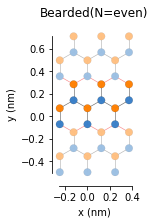

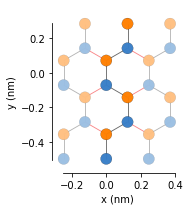

In [142]:
import numpy as np
import matplotlib.pyplot as plt
import pybinding as pb
from pybinding.repository import graphene
a = graphene.a_cc * np.sqrt(3)
a_cc = graphene.a_cc
t = graphene.t
plt.rcParams["figure.figsize"] = (3,3)
def middle4atom(onsite=(0, 0)):
    lat = pb.Lattice(a1=[a, 0], a2=[0, 3*a_cc])

    lat.add_sublattices(('A',  [  0 ,-a_cc], onsite[0]),
                        ('B',  [  -a/2,-a_cc/2], onsite[1]))

    lat.add_aliases(('A2', 'A', [ -a/2, a_cc/2]),
                    ('B2', 'B', [ 0, a_cc]))

    lat.add_hoppings(
        # inside the unit sell
        ([0, 0], 'A',  'B',  t),
        ([0, 0], 'B',  'A2', t),
        ([0, 0], 'A2', 'B2', t),
        # between neighbouring unit cells
        ([ 0, -1], 'A', 'B2', t),
        ([-1,0],'B','A',t),
        ([ -1,0 ], 'A2', 'B2', t),

    )

    lat.min_neighbors = 2
    return lat

lattice = middle4atom()
#lattice.plot()
#plt.title('unit cell')
#plt.show()

model=pb.Model(middle4atom(),
               pb.rectangle(1-1.1*a,1),
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.plot()
plt.title('zigzag (N=odd)')
plt.show()


model=pb.Model(middle4atom(),
               pb.rectangle(1-a/2,1),
               pb.translational_symmetry(a1=False, a2=0.1)
               )
plt.title('zigzag (N=odd)')

model.plot()
plt.show()
model=pb.Model(middle4atom(),
               pb.primitive(a1=3),
               pb.translational_symmetry(a1=False, a2=True)
               )

model.plot()
plt.title('zigzag(N=even)')
plt.show()




model=pb.Model(graphene.monolayer_4atom(),
               pb.primitive(a1=3),
              pb.translational_symmetry(a1=False,a2=True))
model.plot()
plt.title('Bearded(N=even)')
plt.show()

model=pb.Model(graphene.monolayer_4atom(),
               pb.primitive(a2=2),
              pb.translational_symmetry(a1=True,a2=False))
model.plot()
plt.show()




# simple chains and band gap

# 1. bearded(N=even)

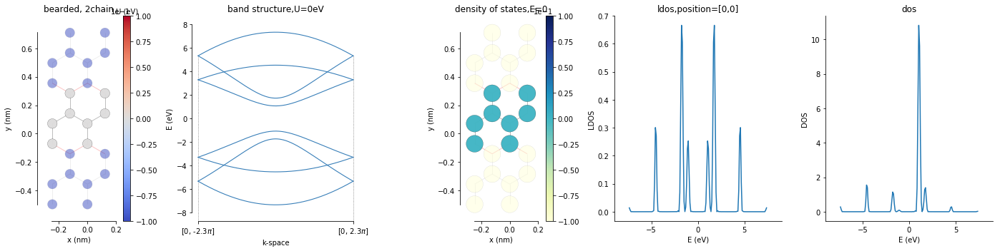

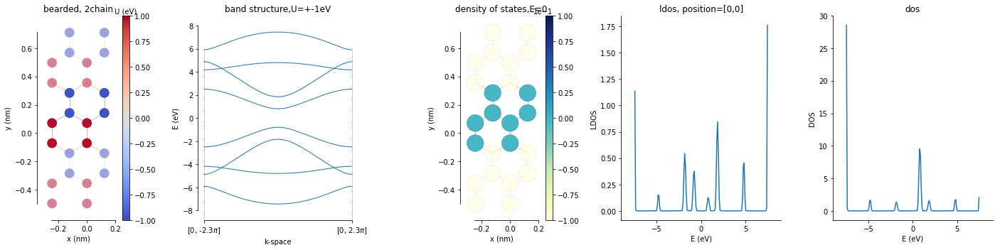

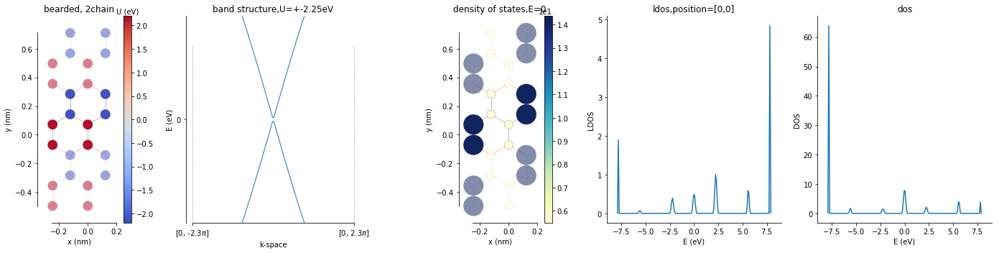

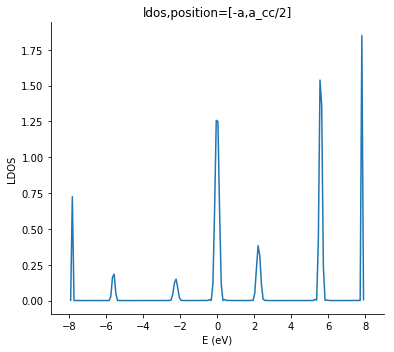

In [143]:
plt.rcParams["figure.figsize"] = (20,5)

model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=2)
               ,
               pnjunctiony(delta=0,y0=a_cc/1.5)
              , pb.translational_symmetry(a1=False, a2=True)
              )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.title('band structure,U=0eV')

plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.tight_layout()

plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=2)
               ,
               pnjunctiony(delta=1,y0=a_cc/1.5)
              , pb.translational_symmetry(a1=False, a2=True)
              )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.title('band structure,U=+-1eV')

plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos, position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()


model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=2)
               ,
               pnjunctiony(delta=2.2,y0=a_cc/1.5)
              , pb.translational_symmetry(a1=False, a2=True)
              )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-2.25eV')

plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()
plt.subplot(141)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[-a,a_cc/2])
ldos.plot()
plt.title('ldos,position=[-a,a_cc/2]')
plt.tight_layout()
plt.show()

# longer unit cell 

# gaussian potential

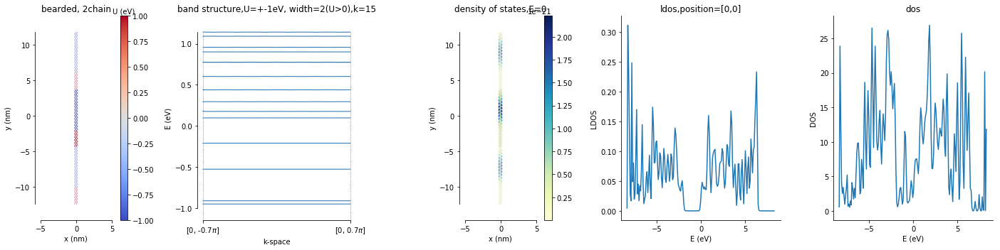

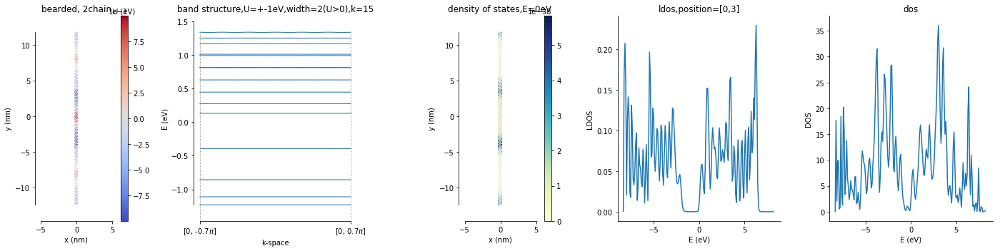

In [197]:
plt.rcParams["figure.figsize"] = (20,5)



model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=2, a2=20),
               pnjunctiony(delta=1, y0=-2),
               pb.translational_symmetry(a1=False, a2=8)
              )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(152)
solver=pb.solver.arpack(model, k=15)
band=solver.calc_bands([0,-np.pi/a_cc/10],[0,np.pi/a_cc/10])
band.plot()
plt.title('band structure,U=+-1eV, width=2(U>0),k=15')

plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=2, a2=20),
               gaussiany(E=1,y0=0,width=2),
               pb.translational_symmetry(a1=False, a2=8)
              )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(152)
solver=pb.solver.arpack(model,k=15)
band=solver.calc_bands([0,-np.pi/a_cc/10],[0,np.pi/a_cc/10])
band.plot()
plt.title('band structure,U=+-1eV,width=2(U>0),k=15')

plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0eV')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,3])
ldos.plot()
plt.title('ldos,position=[0,3]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()




# smooth square well( tanh)

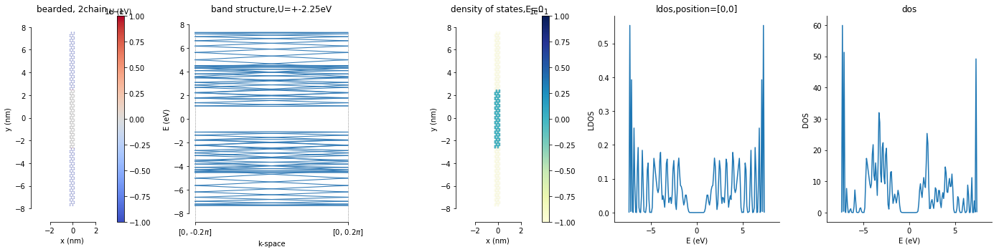

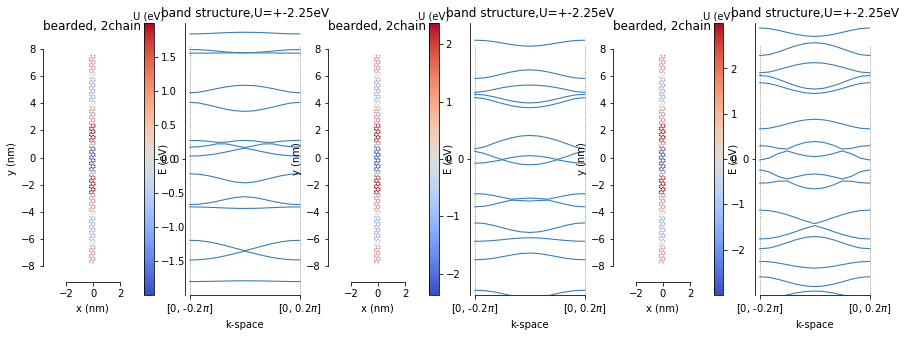

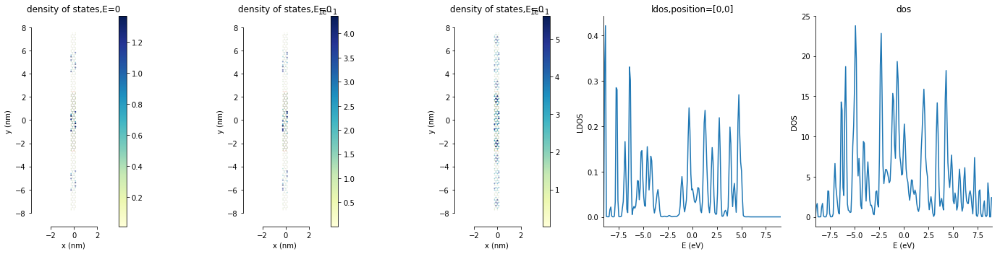

In [144]:
model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=2,a2=20),
               tanhmiddle(E=0,y0=-3*a_cc/4,w=2*3*2.5*a_cc,A=5),
               pb.translational_symmetry(a1=False, a2=14*2.5*a_cc)
              )
#y0=-a/2, w=3*2.5*a_cc, E=2.1
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/(2*7*2.5*a_cc)],[0,np.pi/(2*7*2.5*a_cc)])
band.plot()

plt.title('band structure,U=+-2.25eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=2,a2=20),
               tanhmiddle(E=2,y0=-3*a_cc/4,w=2*3*2.5*a_cc,A=5)
              , pb.translational_symmetry(a1=False, a2=2*7*2.5*a_cc)
              )
#y0=-a/2, w=3*2.5*a_cc, E=2.1
plt.subplot(183)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(184)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/(2*7*2.5*a_cc)],[0,np.pi/(2*7*2.5*a_cc)])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-2.25eV')
model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=2,a2=20),
               tanhmiddle(E=2.37,y0=-a_cc*3/4,w=2*3*2.5*a_cc,A=5)
               ,pb.translational_symmetry(a1=False, a2=2*7*2.5*a_cc)
              )
#y0=-a/2, w=3*2.5*a_cc, E=2.1
plt.subplot(185)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(186)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/(2*7*2.5*a_cc)],[0,np.pi/(2*7*2.5*a_cc)])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-2.25eV')
model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=2,a2=20),
               tanhmiddle(E=3,y0=-a/2,w=2*3*2.5*a_cc,A=5)
              , pb.translational_symmetry(a1=False, a2=2*7*2.5*a_cc)
              )
#y0=-a/2, w=3*2.5*a_cc, E=2.1
plt.subplot(187)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(188)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/(2*7*2.5*a_cc)],[0,np.pi/(2*7*2.5*a_cc)])
band.plot()
plt.title('band structure,U=+-2.25eV')
plt.ylim(-1,1)
plt.show()

model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=2,a2=20),
               tanhmiddle(E=2.37,y0=-a_cc*3/4,w=2*3*2.5*a_cc,A=5)
               ,pb.translational_symmetry(a1=False, a2=2*7*2.5*a_cc)
              )
plt.subplot(151)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(152)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

# N and bandgap

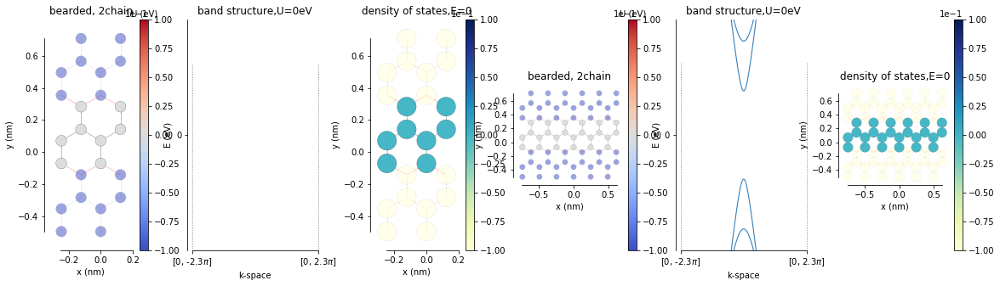

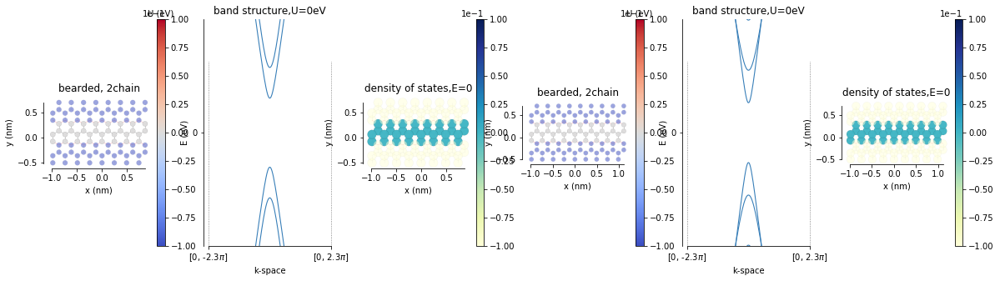

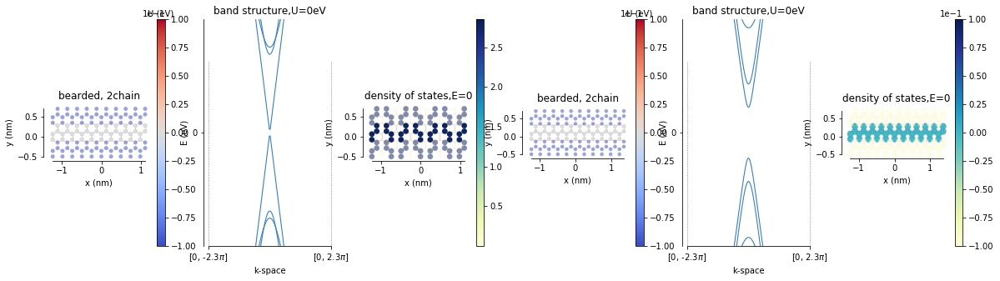

In [145]:
model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=2)
               ,
               pnjunctiony(delta=0,y0=a_cc/1.5)
              , pb.translational_symmetry(a1=False, a2=True)
              )
plt.subplot(161)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(162)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV')

plt.subplot(163)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=6)
               ,
               pnjunctiony(delta=0,y0=a_cc/1.5)
              , pb.translational_symmetry(a1=False, a2=True)
              )
plt.subplot(164)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(165)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV')

plt.subplot(166)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.show()

model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=8)
               ,
               pnjunctiony(delta=0,y0=a_cc/1.5)
              , pb.translational_symmetry(a1=False, a2=True)
              )
plt.subplot(161)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(162)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV')

plt.subplot(163)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=9)
               ,
               pnjunctiony(delta=0,y0=a_cc/1.5)
              , pb.translational_symmetry(a1=False, a2=True)
              )
plt.subplot(164)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(165)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV')

plt.subplot(166)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.show()

model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=10)
               ,
               pnjunctiony(delta=0,y0=a_cc/1.5)
              , pb.translational_symmetry(a1=False, a2=True)
              )
plt.subplot(161)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(162)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV')

plt.subplot(163)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

model=pb.Model( graphene.monolayer_4atom(),
               pb.primitive(a1=11)
               ,
               pnjunctiony(delta=0,y0=a_cc/1.5)
              , pb.translational_symmetry(a1=False, a2=True)
              )
plt.subplot(164)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(165)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV')

plt.subplot(166)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.show()




# 2.zigzag(N=odd)

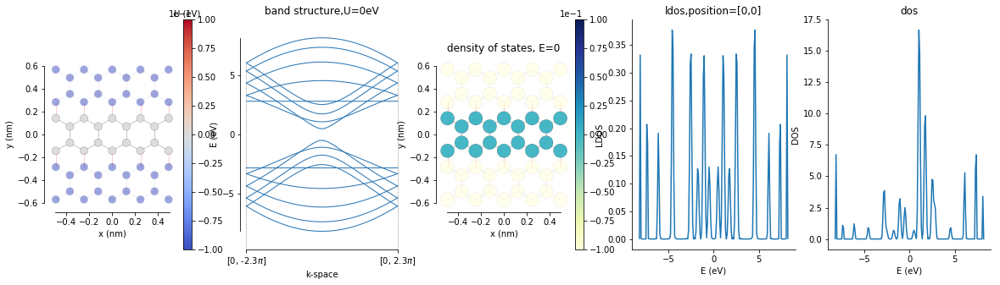

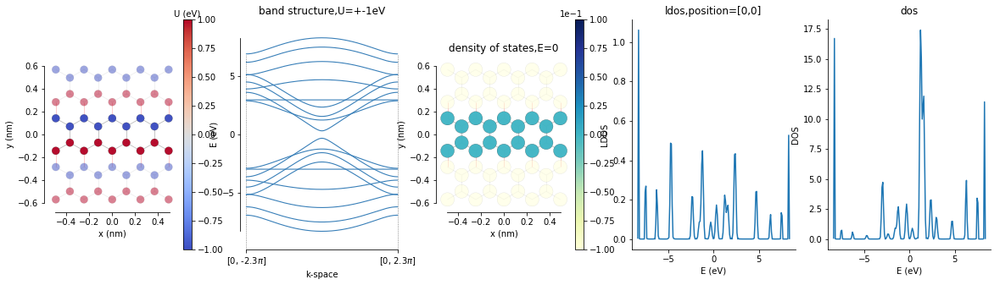

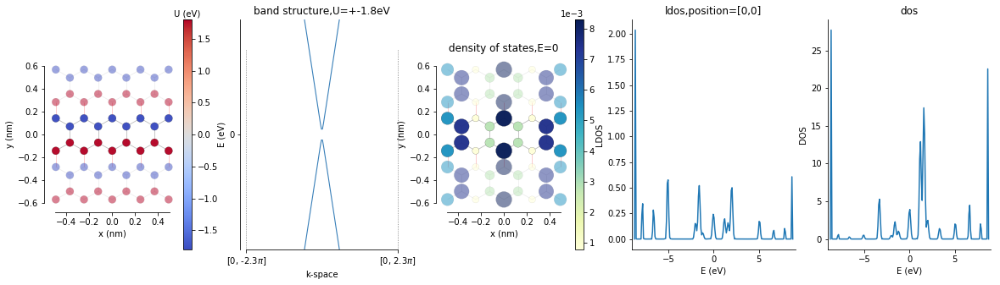

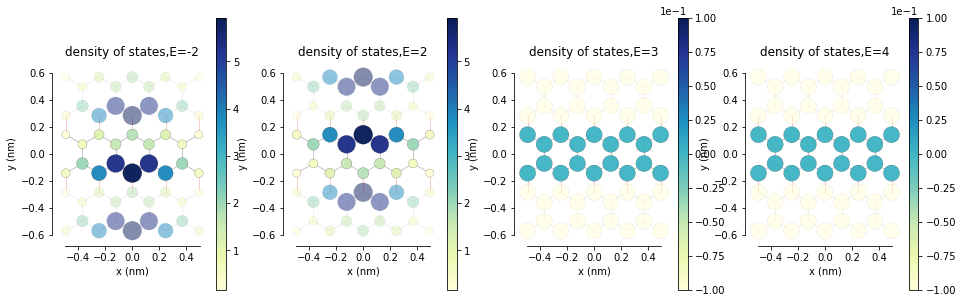

In [16]:
plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.rectangle(1,1),
               pnjunctiony(delta=0,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.title('band structure,U=0eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.rectangle(1,1),
               pnjunctiony(delta=1,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.title('band structure,U=+-1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.rectangle(1,1),
               pnjunctiony(delta=1.8,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()

plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()
plt.subplot(151)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-2, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-2')
pb.pltutils.colorbar()
plt.subplot(152)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=2, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=2')
pb.pltutils.colorbar()
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=3, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=3')
pb.pltutils.colorbar()
plt.subplot(154)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=4, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=4')
pb.pltutils.colorbar()

plt.show()



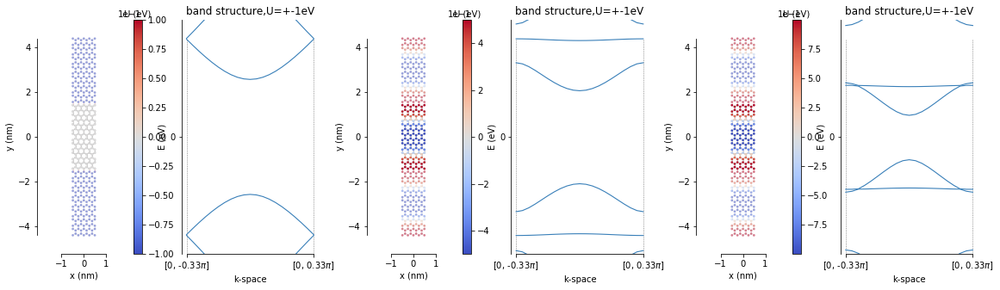

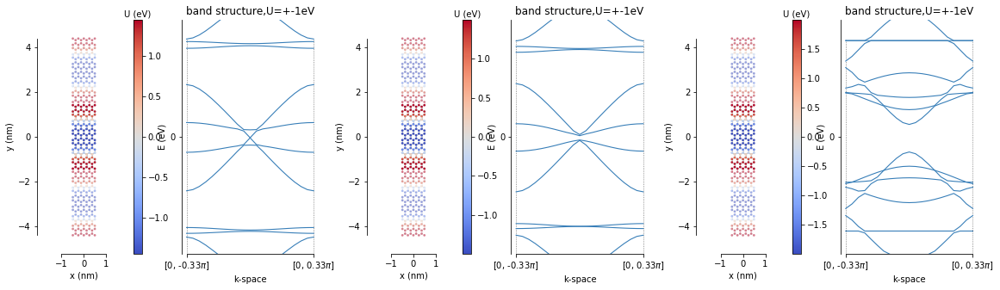

In [168]:
plt.subplot(161)
model=pb.Model(middle4atom(),
               pb.rectangle(1,5)
               ,tanhmiddle(E=0,y0=0,w=1.5,A=5),
               pb.translational_symmetry(a1=False, a2=3)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(162)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1eV')
plt.subplot(163)
model=pb.Model(middle4atom(),
               pb.rectangle(1,5)
               ,tanhmiddle(E=0.5,y0=0,w=1.5,A=5),
               pb.translational_symmetry(a1=False, a2=3)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(164)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1eV')

plt.subplot(165)
model=pb.Model(middle4atom(),
               pb.rectangle(1,5)
               ,tanhmiddle(E=1,y0=0,w=1.5,A=5),
               pb.translational_symmetry(a1=False, a2=3)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(166)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1eV')
plt.show()
plt.subplot(161)
model=pb.Model(middle4atom(),
               pb.rectangle(1,5)
               ,tanhmiddle(E=1.45,y0=0,w=1.5,A=5),
               pb.translational_symmetry(a1=False, a2=3)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(162)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1eV')
plt.subplot(163)
model=pb.Model(middle4atom(),
               pb.rectangle(1,5)
               ,tanhmiddle(E=1.5,y0=0,w=1.5,A=5),
               pb.translational_symmetry(a1=False, a2=3)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(164)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1eV')

plt.subplot(165)
model=pb.Model(middle4atom(),
               pb.rectangle(1,5)
               ,tanhmiddle(E=2,y0=0,w=1.5,A=5),
               pb.translational_symmetry(a1=False, a2=3)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(166)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1eV')
plt.show()
# 1.5 2.5

# x-junction and band gap 

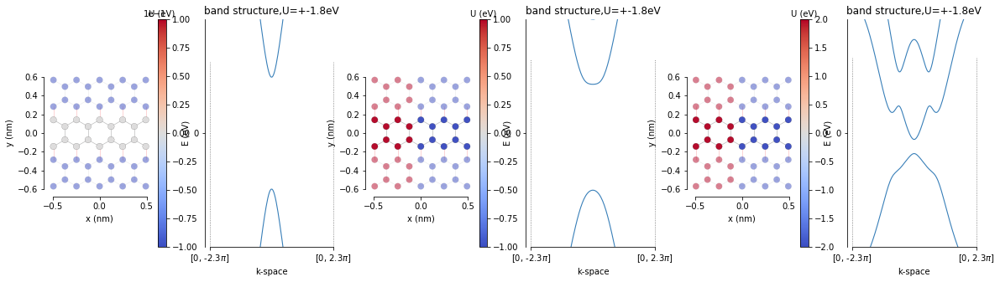

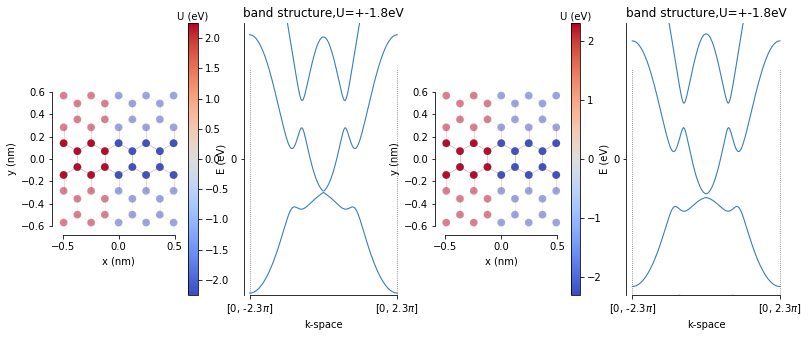

In [156]:
plt.subplot(161)
model=pb.Model(middle4atom(),
               pb.rectangle(1,1),
               pnjunctionx(delta=0,x0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(162)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')

plt.subplot(163)
model=pb.Model(middle4atom(),
               pb.rectangle(1,1),
               pnjunctionx(delta=1,x0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(164)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')

plt.subplot(165)
model=pb.Model(middle4atom(),
               pb.rectangle(1,1),
               pnjunctionx(delta=2,x0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(166)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')

plt.show()

plt.subplot(161)
model=pb.Model(middle4atom(),
               pb.rectangle(1,1),
               pnjunctionx(delta=2.25,x0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(162)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')

plt.subplot(163)
model=pb.Model(middle4atom(),
               pb.rectangle(1,1),
               pnjunctionx(delta=2.3,x0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(164)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')
plt.show()

# 3. zigzag(N=odd)

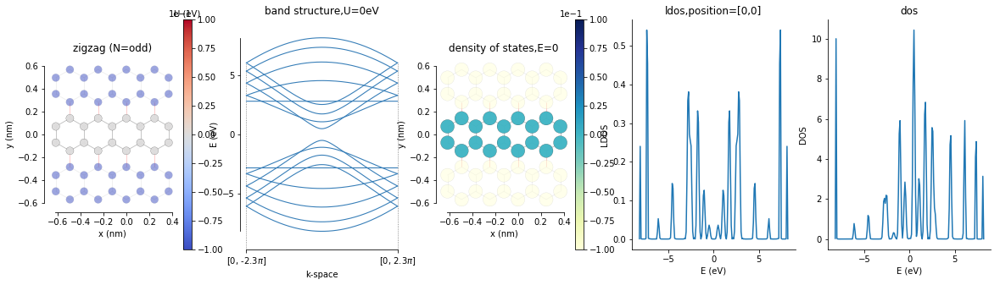

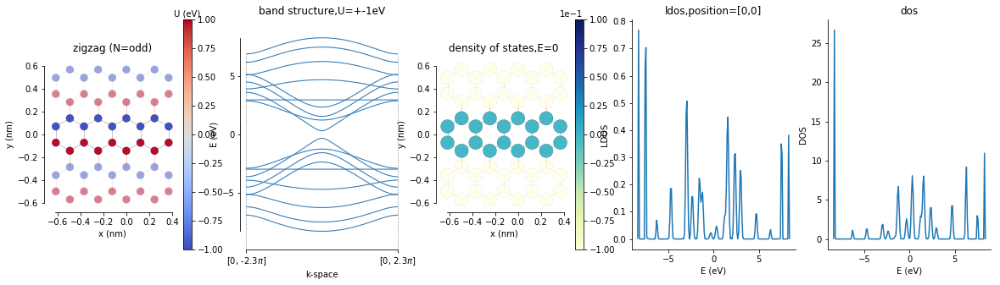

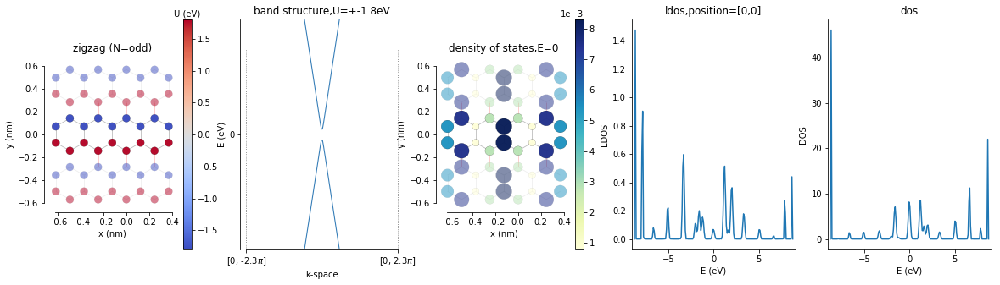

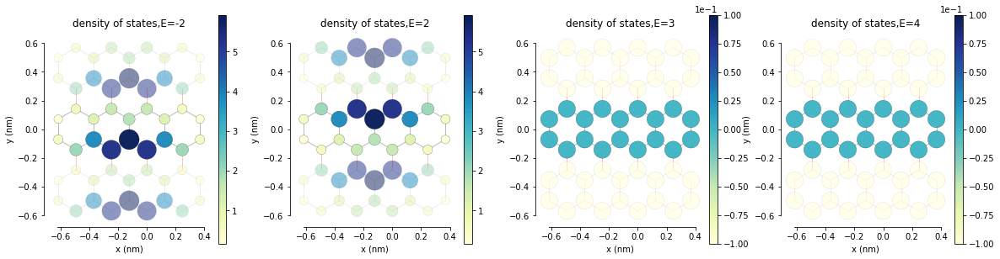

In [146]:
plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.Polygon([[-0.3-2*a,-0.2],[0.3+a,-0.2],[0.3+a,0.2],[-0.3-2*a,0.2]     ]),
               pnjunctiony(delta=0,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('zigzag (N=odd)')
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.title('band structure,U=0eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.Polygon([[-0.3-2*a,-0.2],[0.3+a,-0.2],[0.3+a,0.2],[-0.3-2*a,0.2]     ]),
               pnjunctiony(delta=1,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('zigzag (N=odd)')
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.title('band structure,U=+-1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.Polygon([[-0.3-2*a,-0.2],[0.3+a,-0.2],[0.3+a,0.2],[-0.3-2*a,0.2]     ]),
               pnjunctiony(delta=1.8,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('zigzag (N=odd)')
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()

plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

plt.subplot(141)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-2, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-2')
pb.pltutils.colorbar()
plt.subplot(142)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=2, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=2')
pb.pltutils.colorbar()
plt.subplot(143)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=3, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=3')
pb.pltutils.colorbar()
plt.subplot(144)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=4, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=4')
pb.pltutils.colorbar()

plt.show()

# x-junction and band gap

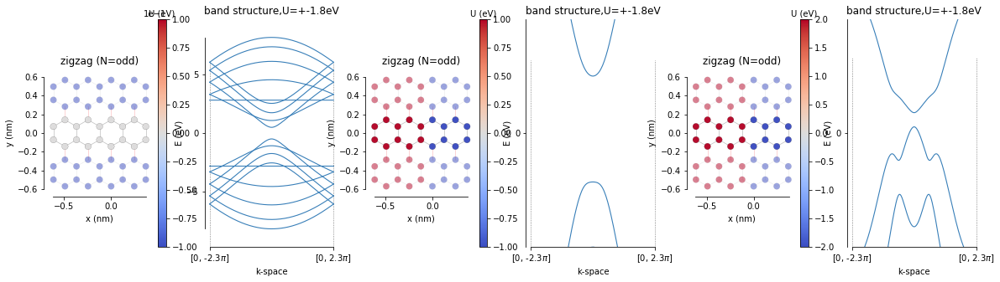

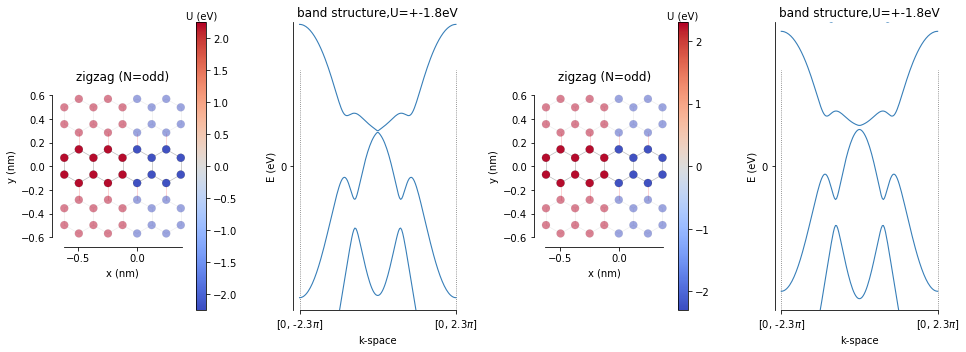

In [157]:
plt.subplot(1,6,1)
model=pb.Model(middle4atom(),
               pb.Polygon([[-0.3-2*a,-0.2],[0.3+a,-0.2],[0.3+a,0.2],[-0.3-2*a,0.2]     ]),
               pnjunctionx(delta=0,x0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('zigzag (N=odd)')
plt.subplot(1,6,2)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()


plt.title('band structure,U=+-1.8eV')


plt.subplot(1,6,3)
model=pb.Model(middle4atom(),
               pb.Polygon([[-0.3-2*a,-0.2],[0.3+a,-0.2],[0.3+a,0.2],[-0.3-2*a,0.2]     ]),
               pnjunctionx(delta=1,x0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('zigzag (N=odd)')
plt.subplot(1,6,4)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(-1,1)


plt.title('band structure,U=+-1.8eV')
plt.subplot(1,6,5)

model=pb.Model(middle4atom(),
               pb.Polygon([[-0.3-2*a,-0.2],[0.3+a,-0.2],[0.3+a,0.2],[-0.3-2*a,0.2]     ]),
               pnjunctionx(delta=2,x0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('zigzag (N=odd)')
plt.subplot(1,6,6)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()

plt.ylim(-1,1)


plt.title('band structure,U=+-1.8eV')
plt.show()
plt.subplot(1,6,1)

model=pb.Model(middle4atom(),
               pb.Polygon([[-0.3-2*a,-0.2],[0.3+a,-0.2],[0.3+a,0.2],[-0.3-2*a,0.2]     ]),
               pnjunctionx(delta=2.25,x0=0)#2.25
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('zigzag (N=odd)')
plt.subplot(1,6,2)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()

plt.ylim(-1,1)


plt.title('band structure,U=+-1.8eV')
plt.subplot(1,6,3)

model=pb.Model(middle4atom(),
               pb.Polygon([[-0.3-2*a,-0.2],[0.3+a,-0.2],[0.3+a,0.2],[-0.3-2*a,0.2]     ]),
               pnjunctionx(delta=2.3,x0=0)# 3
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('zigzag (N=odd)')
plt.subplot(1,6,4)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()

plt.ylim(-1,1)


plt.title('band structure,U=+-1.8eV')
plt.tight_layout()
plt.show()


# 4.

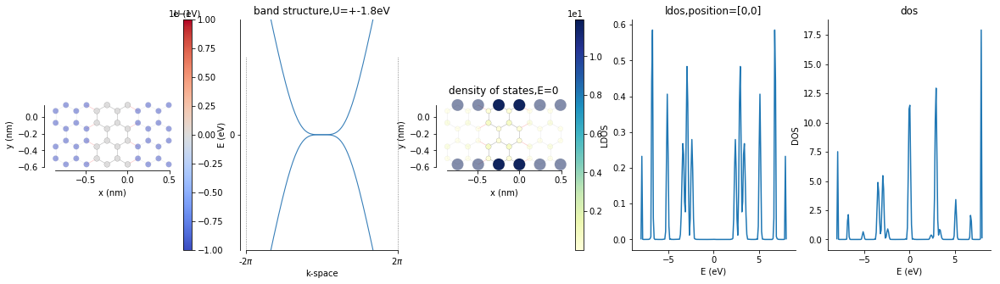

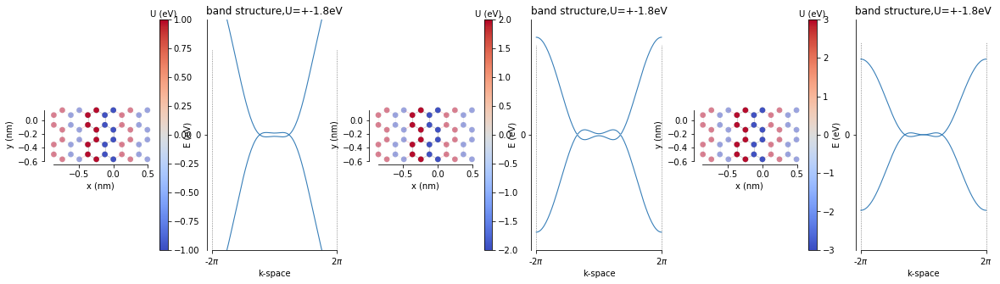

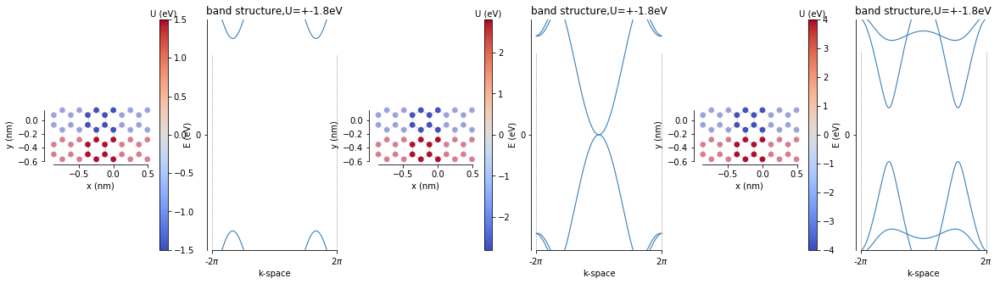

In [176]:
plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.primitive(a2=2,a1=3)
               ,
               pb.translational_symmetry(a1=2*a, a2=False)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(-np.pi/2/a,np.pi/2/a)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()

plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

plt.subplot(161)
model=pb.Model(middle4atom(),
               pb.primitive(a2=2,a1=3)
               ,pnjunctionx(delta=1,x0=-a_cc),
               pb.translational_symmetry(a1=2*a, a2=False)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(162)
solver=pb.solver.lapack(model)
band=solver.calc_bands(-np.pi/2/a,np.pi/2/a)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')
plt.subplot(163)
model=pb.Model(middle4atom(),
               pb.primitive(a2=2,a1=3)
               ,pnjunctionx(delta=2,x0=-a_cc),
               pb.translational_symmetry(a1=2*a, a2=False)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(164)
solver=pb.solver.lapack(model)
band=solver.calc_bands(-np.pi/2/a,np.pi/2/a)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')

plt.subplot(165)
model=pb.Model(middle4atom(),
               pb.primitive(a2=2,a1=3)
               ,pnjunctionx(delta=3,x0=-a_cc),
               pb.translational_symmetry(a1=2*a, a2=False)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(166)
solver=pb.solver.lapack(model)
band=solver.calc_bands(-np.pi/2/a,np.pi/2/a)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')

plt.show()

plt.subplot(161)
model=pb.Model(middle4atom(),
               pb.primitive(a2=2,a1=3)
               ,pnjunctiony(delta=1.5,y0=-0.2),
               pb.translational_symmetry(a1=2*a, a2=False)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(162)
solver=pb.solver.lapack(model)
band=solver.calc_bands(-np.pi/2/a,np.pi/2/a)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')
plt.subplot(163)
model=pb.Model(middle4atom(),
               pb.primitive(a2=2,a1=3)
               ,pnjunctiony(delta=2.8,y0=-0.2),
               pb.translational_symmetry(a1=2*a, a2=False)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(164)
solver=pb.solver.lapack(model)
band=solver.calc_bands(-np.pi/2/a,np.pi/2/a)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')

plt.subplot(165)
model=pb.Model(middle4atom(),
               pb.primitive(a2=2,a1=3)
               ,pnjunctiony(delta=4,y0=-0.2),
               pb.translational_symmetry(a1=2*a, a2=False)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(166)
solver=pb.solver.lapack(model)
band=solver.calc_bands(-np.pi/2/a,np.pi/2/a)
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.8eV')

plt.show()

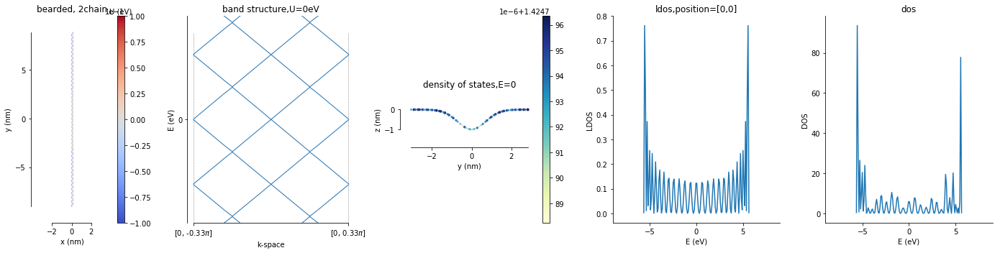

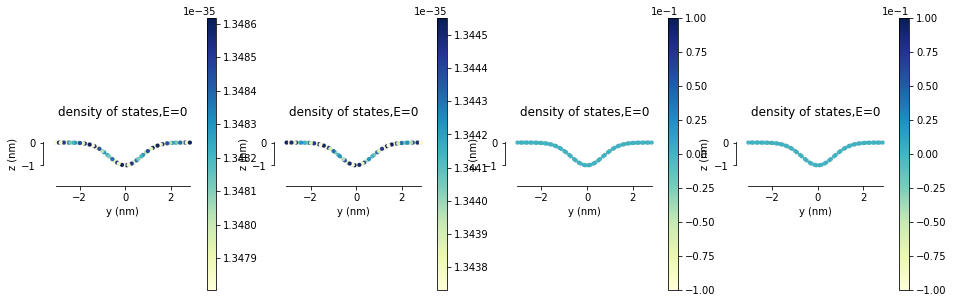

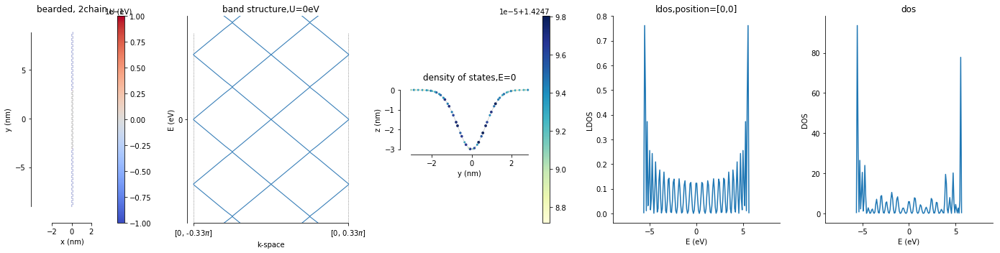

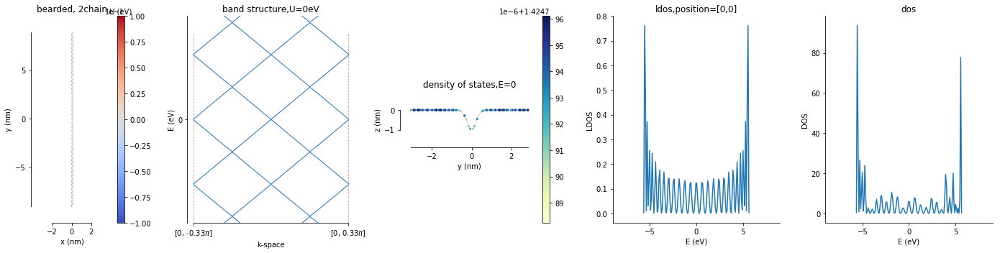

In [196]:
model=pb.Model(graphene.monolayer_4atom()
                ,pb.primitive(a2=30)
                ,zmod(1,1,0,0)
               ,pb.translational_symmetry(a1=False, a2=6)
               )

plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV')

plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07),axes='yz',num_periods=0)
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.tight_layout()

plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

plt.subplot(151)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07),axes='yz',num_periods=0)
plt.title('density of states,E=0')
pb.pltutils.colorbar()
plt.subplot(152)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07),axes='yz',num_periods=0)
plt.title('density of states,E=0')
pb.pltutils.colorbar()
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07),axes='yz',num_periods=0)
plt.title('density of states,E=0')
pb.pltutils.colorbar()
plt.subplot(154)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07),axes='yz',num_periods=0)
plt.title('density of states,E=0')
pb.pltutils.colorbar()
plt.show()


model=pb.Model(graphene.monolayer_4atom()
                ,pb.primitive(a2=30)
                ,zmod(3,1,0,0)
               ,pb.translational_symmetry(a1=False, a2=6)
               )

plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV')

plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07),axes='yz',num_periods=0)
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.tight_layout()

plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

model=pb.Model(graphene.monolayer_4atom()
                ,pb.primitive(a2=30)
                ,zmod(1,10,0,0)
               ,pb.translational_symmetry(a1=False, a2=6)
               )

plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('bearded, 2chain')
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV')

plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07),axes='yz',num_periods=0)
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.tight_layout()

plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

# complex chains

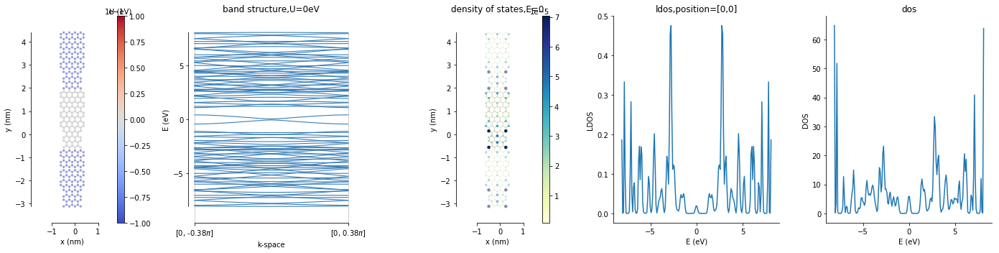

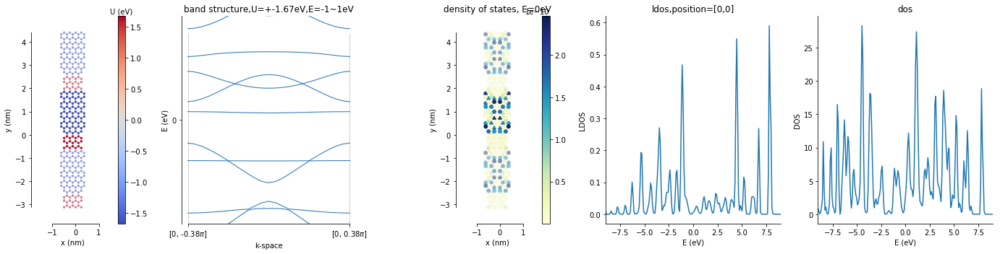

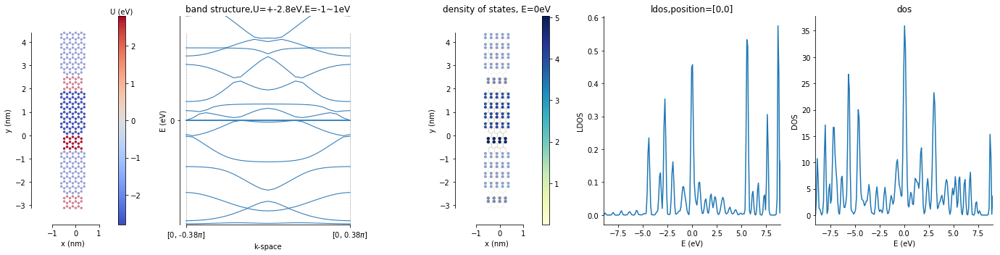

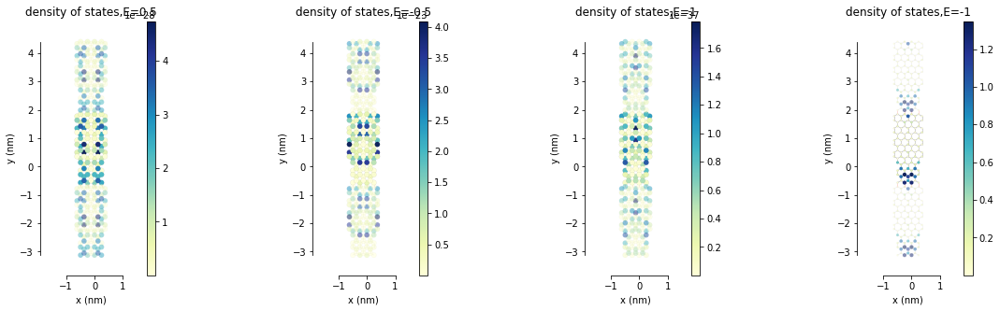

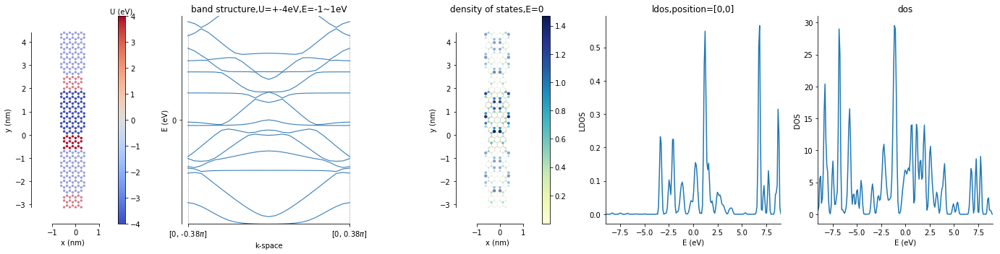

In [10]:
plt.rcParams["figure.figsize"] = (20,5)
model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5,-0.6-2*a_cc],[0.3,-0.6-2*a_cc],[0.3,1.1*a_cc],[-0.5,1.1*a_cc]])+pb.Polygon([[-0.65,1.1*a_cc],[2*a,1.1*a_cc],[2*a,2+a_cc],[-0.65,2+a_cc]])
               
               ,
               pnjunctiony(delta=0,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=2.6)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")

plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()

plt.title('band structure,U=0eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')

plt.tight_layout()

plt.show()


#1.67
model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5,-0.6-2*a_cc],[0.3,-0.6-2*a_cc],[0.3,1.1*a_cc],[-0.5,1.1*a_cc]])+pb.Polygon([[-0.65,1.1*a_cc],[2*a,1.1*a_cc],[2*a,2+a_cc],[-0.65,2+a_cc]])
               
               ,
               pnjunctiony(delta=1.67,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=2.6)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")

plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.67eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=0eV')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()



model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5,-0.6-2*a_cc],[0.3,-0.6-2*a_cc],[0.3,1.1*a_cc],[-0.5,1.1*a_cc]])+pb.Polygon([[-0.65,1.1*a_cc],[2*a,1.1*a_cc],[2*a,2+a_cc],[-0.65,2+a_cc]])
               
               ,
               pnjunctiony(delta=2.8,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=2.6)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")

plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-2.8eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=0eV')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()
plt.subplot(141)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0.5')
pb.pltutils.colorbar()
plt.subplot(142)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-0.5')
pb.pltutils.colorbar()
plt.subplot(143)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=1')
pb.pltutils.colorbar()
plt.subplot(144)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-1')
pb.pltutils.colorbar()
plt.show()


model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5,-0.6-2*a_cc],[0.3,-0.6-2*a_cc],[0.3,1.1*a_cc],[-0.5,1.1*a_cc]])+pb.Polygon([[-0.65,1.1*a_cc],[2*a,1.1*a_cc],[2*a,2+a_cc],[-0.65,2+a_cc]])
               
               ,#2.4
               pnjunctiony(delta=4,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=2.6)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")

plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-4eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()



plt.show()

# shorter length(U<0 part) chain 

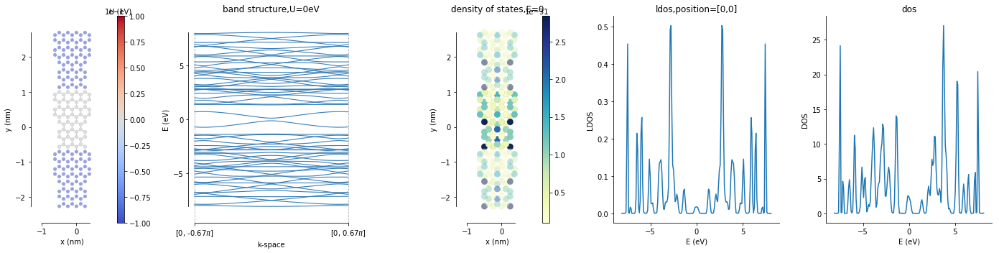

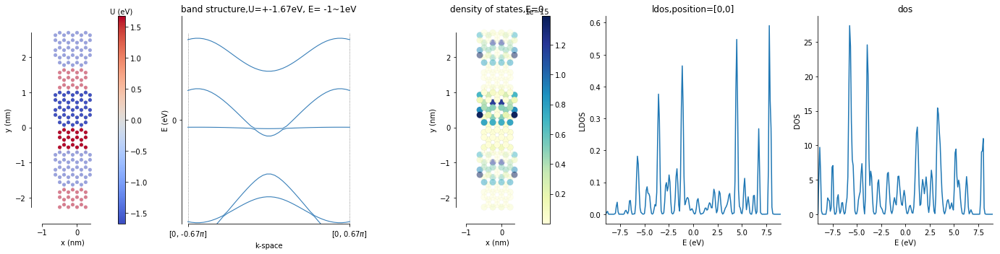

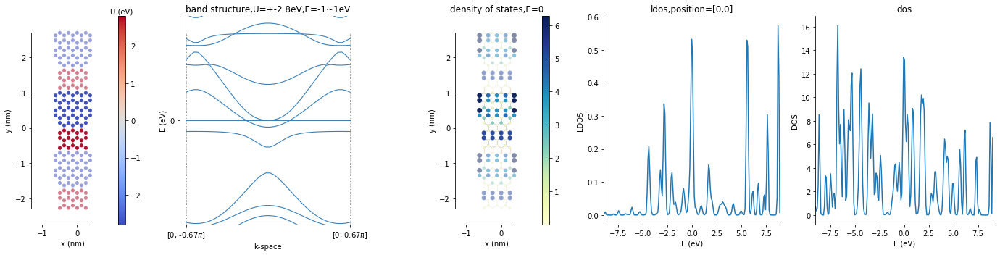

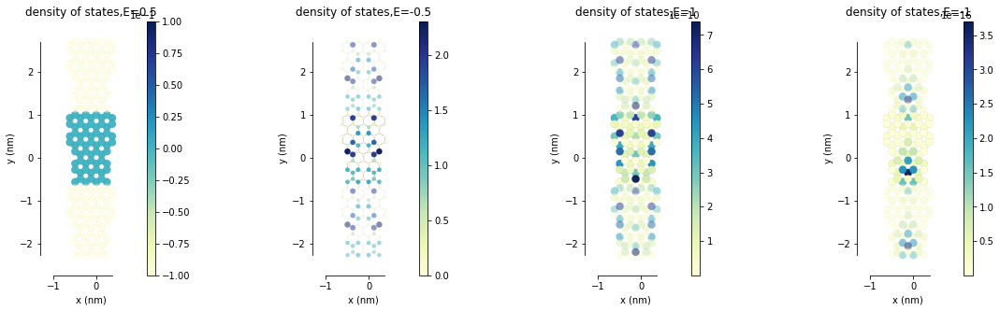

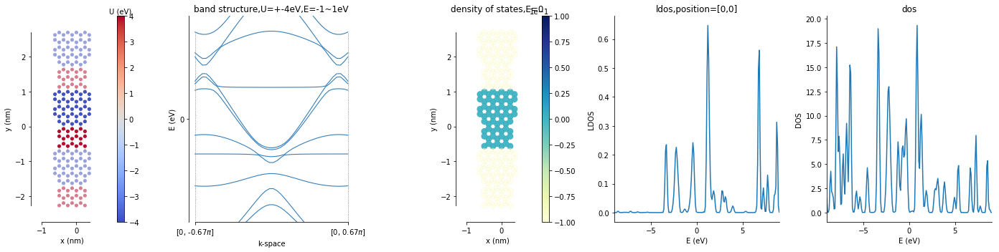

In [12]:

model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5,-0.6-2*a_cc],[0.3,-0.6-2*a_cc],[0.3,1.1*a_cc],[-0.5,1.1*a_cc]])+pb.Polygon([[-0.65,1.1*a_cc],[2*a,1.1*a_cc],[2*a,2],[-0.65,2]])
               
               ,
               pnjunctiony(delta=0,y0=0)
               ,
               pb.translational_symmetry(a1=False,a2=1.5)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/1.5],[0,np.pi/1.5])
band.plot()

plt.title('band structure,U=0eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()








model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5,-0.6-2*a_cc],[0.3,-0.6-2*a_cc],[0.3,1.1*a_cc],[-0.5,1.1*a_cc]])+pb.Polygon([[-0.65,1.1*a_cc],[2*a,1.1*a_cc],[2*a,2],[-0.65,2]])
               
               ,
               pnjunctiony(delta=1.67,y0=0)
               ,
               pb.translational_symmetry(a1=False,a2=1.5)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/1.5],[0,np.pi/1.5])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.67eV, E= -1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()



model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5,-0.6-2*a_cc],[0.3,-0.6-2*a_cc],[0.3,1.1*a_cc],[-0.5,1.1*a_cc]])+pb.Polygon([[-0.65,1.1*a_cc],[2*a,1.1*a_cc],[2*a,2],[-0.65,2]])
               
               ,
               pnjunctiony(delta=2.8,y0=0)
               ,
               pb.translational_symmetry(a1=False,a2=1.5)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/1.5],[0,np.pi/1.5])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-2.8eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

plt.subplot(141)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0.5')
pb.pltutils.colorbar()
plt.subplot(142)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-0.5')
pb.pltutils.colorbar()
plt.subplot(143)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=1')
pb.pltutils.colorbar()
plt.subplot(144)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-1')
pb.pltutils.colorbar()
plt.show()


model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5,-0.6-2*a_cc],[0.3,-0.6-2*a_cc],[0.3,1.1*a_cc],[-0.5,1.1*a_cc]])+pb.Polygon([[-0.65,1.1*a_cc],[2*a,1.1*a_cc],[2*a,2],[-0.65,2]])
               
               ,
               pnjunctiony(delta=4,y0=0)
               ,
               pb.translational_symmetry(a1=False,a2=1.5)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/1.5],[0,np.pi/1.5])
band.plot()

plt.ylim(-1,1)

plt.title('band structure,U=+-4eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

#1
#3


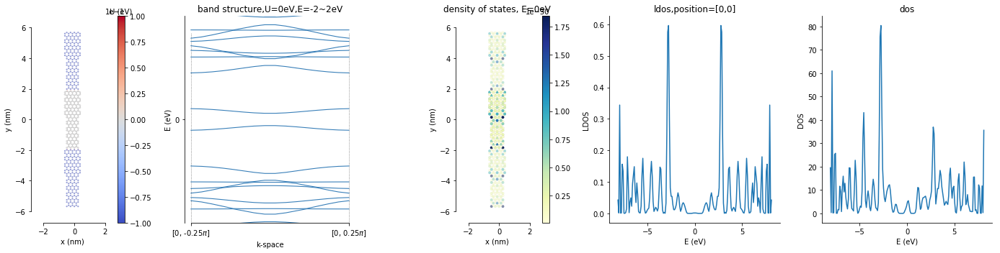

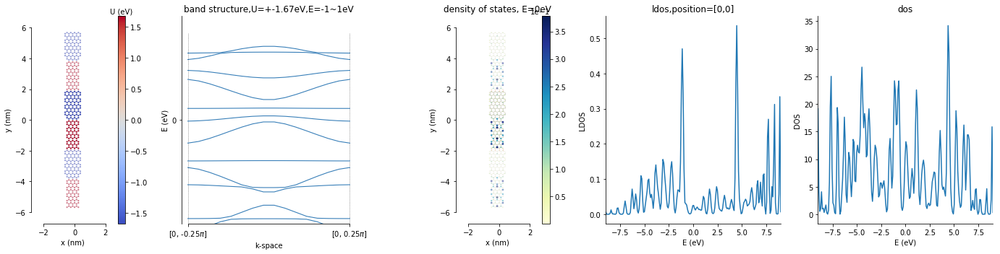

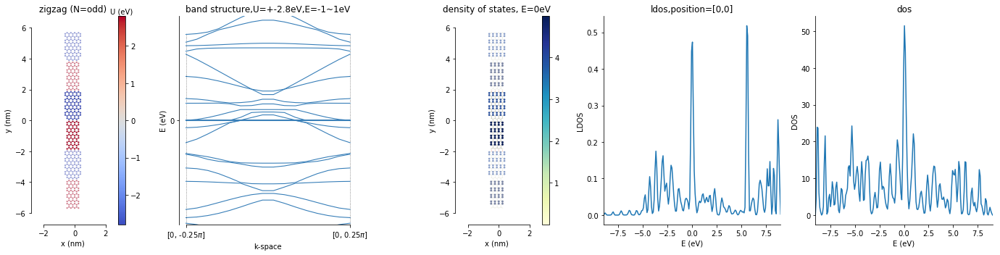

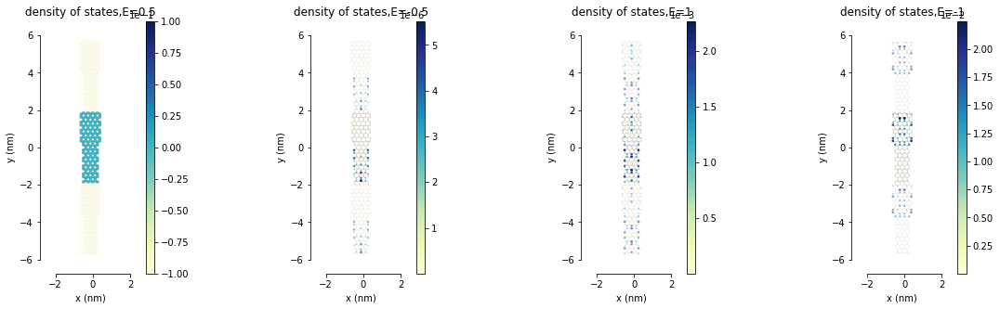

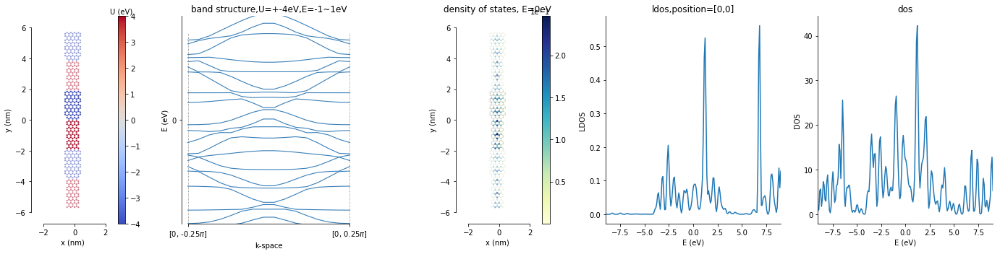

In [8]:
model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-0.5,1.1*a_cc]])+pb.Polygon([[-0.65,1.1*a_cc],[2*a,1.1*a_cc],[2*a,2+a_cc],[-0.65,2+a_cc]])
               
               ,
               pnjunctiony(delta=0,y0=0)
               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-2,2)
plt.title('band structure,U=0eV,E=-2~2eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=0eV')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()



model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-0.5,1.1*a_cc]])+pb.Polygon([[-0.65,1.1*a_cc],[2*a,1.1*a_cc],[2*a,2+a_cc],[-0.65,2+a_cc]])
               
               ,
               pnjunctiony(delta=1.67,y0=0)#2.8
               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.67eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=0eV')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-0.5,1.1*a_cc]])+pb.Polygon([[-0.65,1.1*a_cc],[2*a,1.1*a_cc],[2*a,2+a_cc],[-0.65,2+a_cc]])
               
               ,
               pnjunctiony(delta=2.8,y0=0)
               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('zigzag (N=odd)')
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-2.8eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=0eV')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

plt.subplot(141)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0.5')
pb.pltutils.colorbar()
plt.subplot(142)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-0.5')
pb.pltutils.colorbar()
plt.subplot(143)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=1')
pb.pltutils.colorbar()
plt.subplot(144)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-1')
pb.pltutils.colorbar()
plt.show()


model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-0.5,1.1*a_cc]])+pb.Polygon([[-0.65,1.1*a_cc],[2*a,1.1*a_cc],[2*a,2+a_cc],[-0.65,2+a_cc]])
               
               ,
               pnjunctiony(delta=4,y0=0)
               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-4eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=0eV')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()




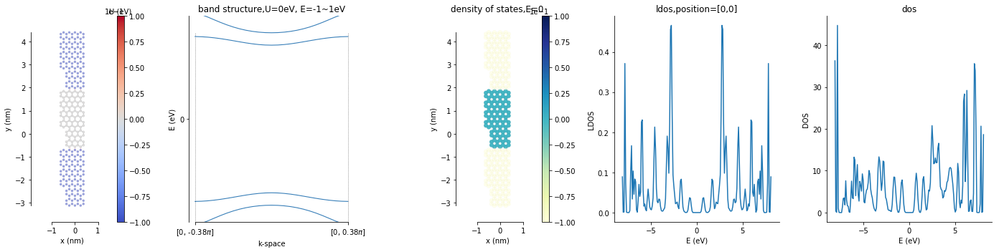

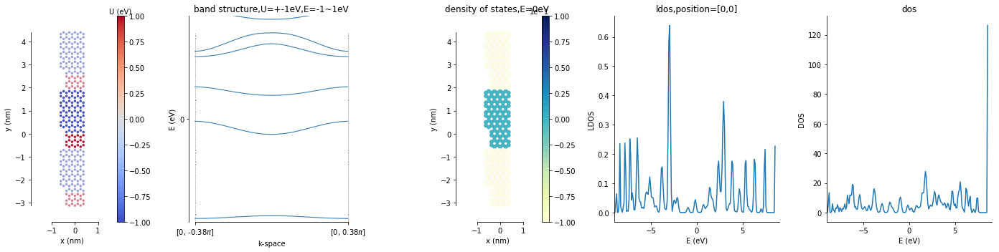

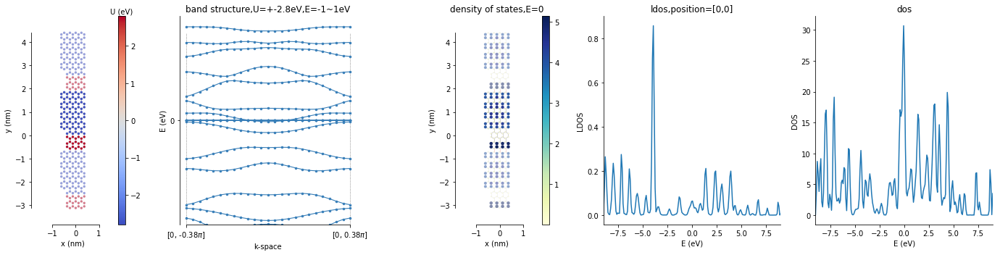

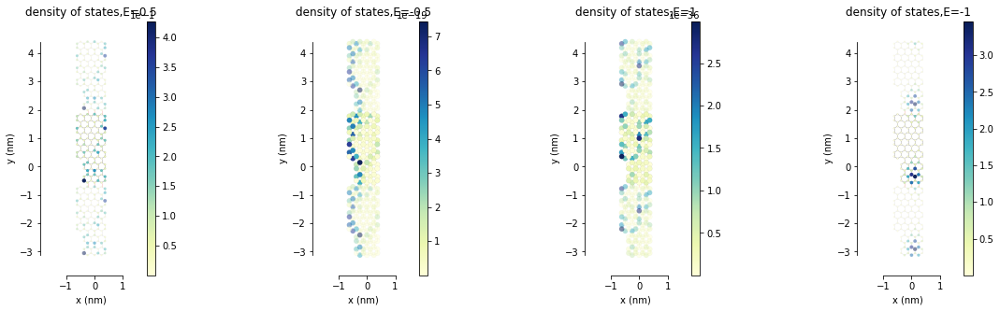

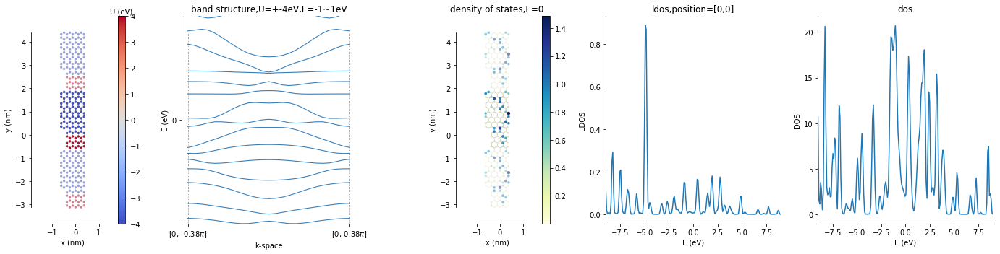

In [13]:
model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5+a/2,-0.6],[0.5-a/2,-0.6],[0.5-a/2,1.5*a_cc],[-0.5+a/2,1.5*a_cc]])+pb.Polygon([[-0.65,1.5*a_cc],[1.8*a,1.5*a_cc],[1.8*a,2+a_cc],[-0.65,2+a_cc]])
               ,
               pnjunctiony(delta=0,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=2.6)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV, E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5+a/2,-0.6],[0.5-a/2,-0.6],[0.5-a/2,1.5*a_cc],[-0.5+a/2,1.5*a_cc]])+pb.Polygon([[-0.65,1.5*a_cc],[1.8*a,1.5*a_cc],[1.8*a,2+a_cc],[-0.65,2+a_cc]])
               ,
               pnjunctiony(delta=1,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=2.6)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0eV')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()



model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5+a/2,-0.6],[0.5-a/2,-0.6],[0.5-a/2,1.5*a_cc],[-0.5+a/2,1.5*a_cc]])+pb.Polygon([[-0.65,1.5*a_cc],[1.8*a,1.5*a_cc],[1.8*a,2+a_cc],[-0.65,2+a_cc]])
               ,
               pnjunctiony(delta=2.8,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=2.6)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot(marker='.',markersize=5)
plt.ylim(-1,1)
plt.title('band structure,U=+-2.8eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

plt.subplot(141)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0.5')
pb.pltutils.colorbar()
plt.subplot(142)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-0.5')
pb.pltutils.colorbar()
plt.subplot(143)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=1')
pb.pltutils.colorbar()
plt.subplot(144)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-1')
pb.pltutils.colorbar()
plt.show()


model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5+a/2,-0.6],[0.5-a/2,-0.6],[0.5-a/2,1.5*a_cc],[-0.5+a/2,1.5*a_cc]])+pb.Polygon([[-0.65,1.5*a_cc],[1.8*a,1.5*a_cc],[1.8*a,2+a_cc],[-0.65,2+a_cc]])
               ,
               pnjunctiony(delta=4,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=2.6)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-4eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()


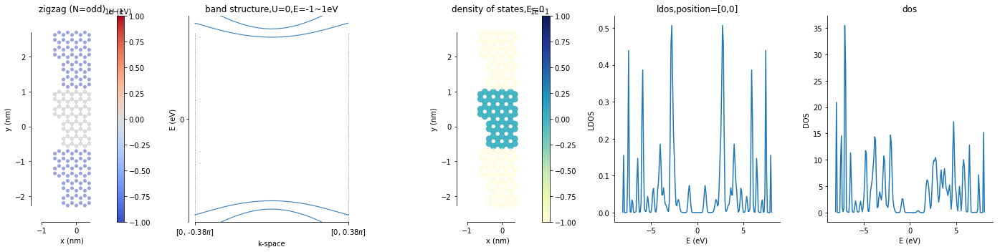

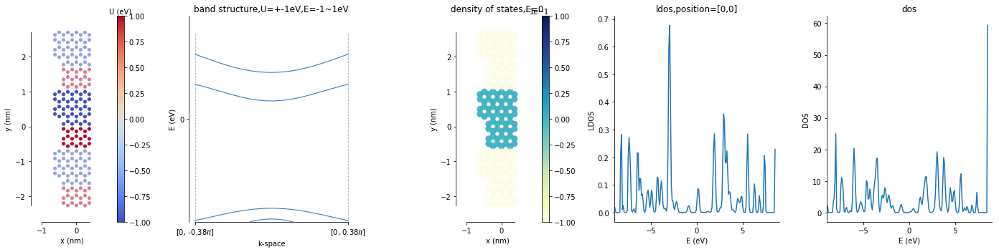

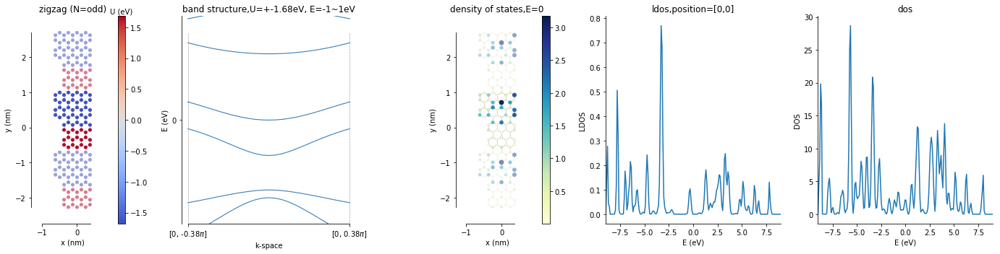

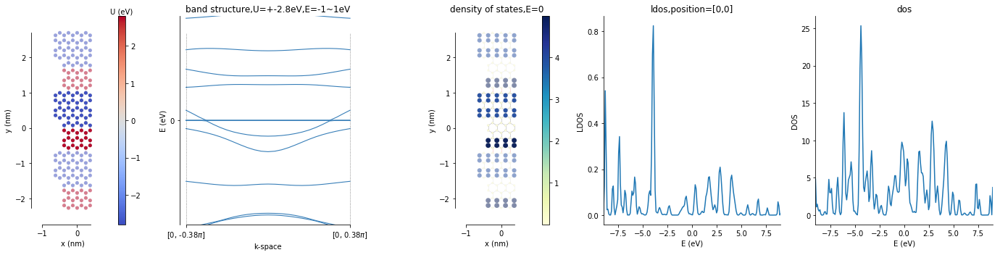

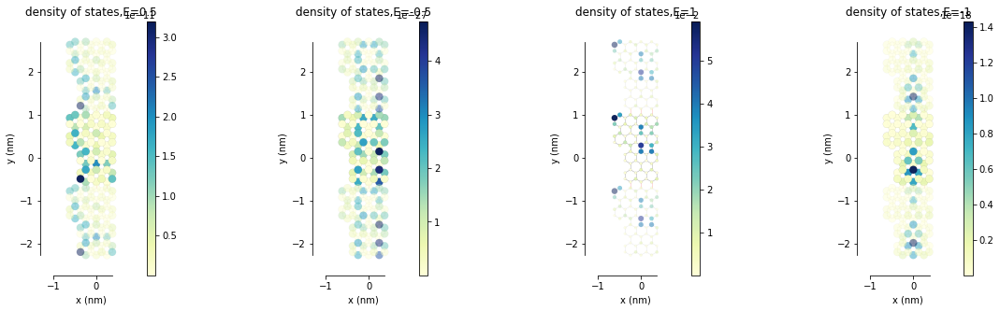

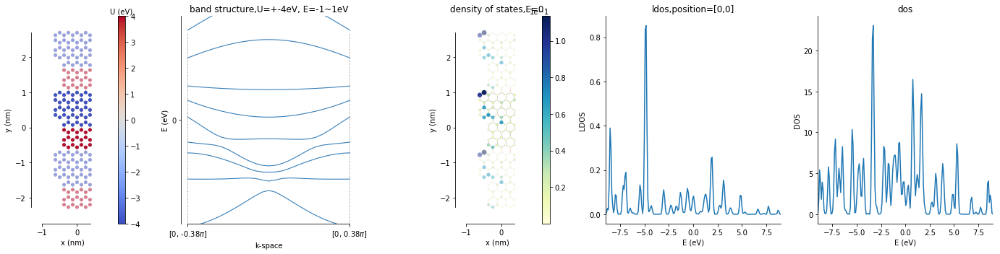

In [14]:
model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5+a/2,-0.6],[0.5-a/2,-0.6],[0.5-a/2,1.5*a_cc],[-0.5+a/2,1.5*a_cc]])+pb.Polygon([[-0.65,1.5*a_cc],[1.8*a,1.5*a_cc],[1.8*a,1+a_cc],[-0.65,1+a_cc]])
               ,
               pnjunctiony(delta=0,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=1.5)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('zigzag (N=odd)')
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.tight_layout()
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5+a/2,-0.6],[0.5-a/2,-0.6],[0.5-a/2,1.5*a_cc],[-0.5+a/2,1.5*a_cc]])+pb.Polygon([[-0.65,1.5*a_cc],[1.8*a,1.5*a_cc],[1.8*a,1+a_cc],[-0.65,1+a_cc]])
               ,
               pnjunctiony(delta=1,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=1.5)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5+a/2,-0.6],[0.5-a/2,-0.6],[0.5-a/2,1.5*a_cc],[-0.5+a/2,1.5*a_cc]])+pb.Polygon([[-0.65,1.5*a_cc],[1.8*a,1.5*a_cc],[1.8*a,1+a_cc],[-0.65,1+a_cc]])
               ,
               pnjunctiony(delta=1.68,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=1.5)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.title('zigzag (N=odd)')
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.68eV, E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5+a/2,-0.6],[0.5-a/2,-0.6],[0.5-a/2,1.5*a_cc],[-0.5+a/2,1.5*a_cc]])+pb.Polygon([[-0.65,1.5*a_cc],[1.8*a,1.5*a_cc],[1.8*a,1+a_cc],[-0.65,1+a_cc]])
               ,
               pnjunctiony(delta=2.8,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=1.5)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-2.8eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()
plt.subplot(141)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0.5')
pb.pltutils.colorbar()
plt.subplot(142)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-0.5')
pb.pltutils.colorbar()
plt.subplot(143)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=1')
pb.pltutils.colorbar()
plt.subplot(144)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-1')
pb.pltutils.colorbar()
plt.show()
model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5+a/2,-0.6],[0.5-a/2,-0.6],[0.5-a/2,1.5*a_cc],[-0.5+a/2,1.5*a_cc]])+pb.Polygon([[-0.65,1.5*a_cc],[1.8*a,1.5*a_cc],[1.8*a,1+a_cc],[-0.65,1+a_cc]])
               ,
               pnjunctiony(delta=4,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=1.5)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-4eV, E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

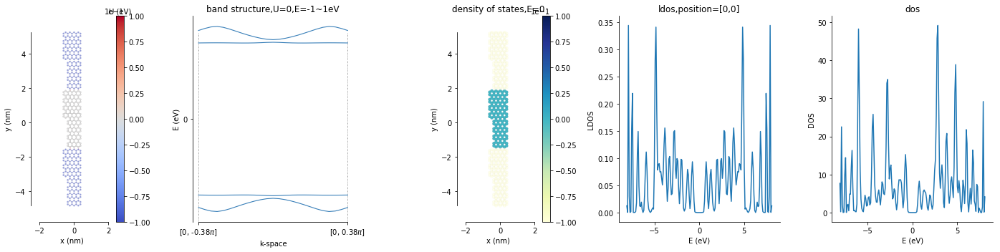

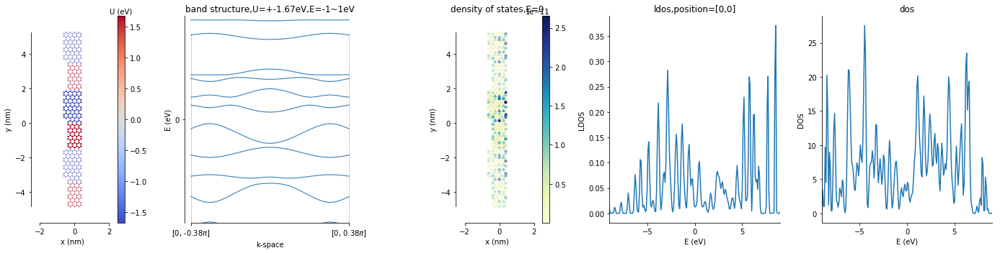

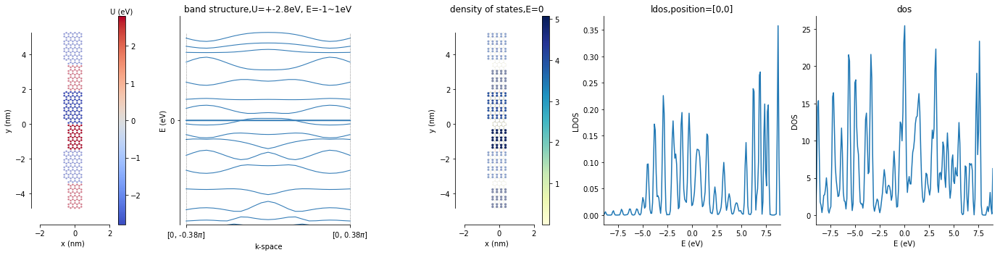

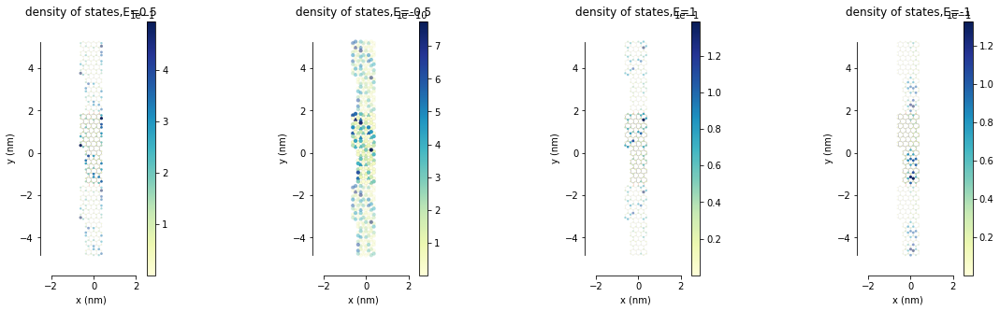

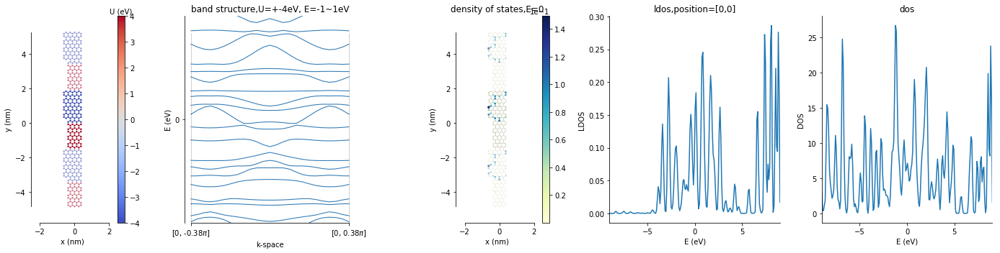

In [15]:
model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5+a/2,-1.5-2*a],[0.5-a/2,-1.5-2*a],[0.5-a/2,1.5*a_cc],[-0.5+a/2,1.5*a_cc]])+pb.Polygon([[-0.65,1.5*a_cc],[1.8*a,1.5*a_cc],[1.8*a,2+a_cc],[-0.65,2+a_cc]])
               ,
               pnjunctiony(delta=0,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=3.5)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")

plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()

plt.show()


model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5+a/2,-1.5-2*a],[0.5-a/2,-1.5-2*a],[0.5-a/2,1.5*a_cc],[-0.5+a/2,1.5*a_cc]])+pb.Polygon([[-0.65,1.5*a_cc],[1.8*a,1.5*a_cc],[1.8*a,2+a_cc],[-0.65,2+a_cc]])
               ,
               pnjunctiony(delta=1.67,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=3.5)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.67eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5+a/2,-1.5-2*a],[0.5-a/2,-1.5-2*a],[0.5-a/2,1.5*a_cc],[-0.5+a/2,1.5*a_cc]])+pb.Polygon([[-0.65,1.5*a_cc],[1.8*a,1.5*a_cc],[1.8*a,2+a_cc],[-0.65,2+a_cc]])
               ,
               pnjunctiony(delta=2.8,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=3.5)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-2.8eV, E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

plt.subplot(141)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0.5')
pb.pltutils.colorbar()
plt.subplot(142)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-0.5')
pb.pltutils.colorbar()
plt.subplot(143)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=1')
pb.pltutils.colorbar()
plt.subplot(144)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-1')
pb.pltutils.colorbar()
plt.show()

model=pb.Model(middle4atom(),
               pb.Polygon([[-0.5+a/2,-1.5-2*a],[0.5-a/2,-1.5-2*a],[0.5-a/2,1.5*a_cc],[-0.5+a/2,1.5*a_cc]])+pb.Polygon([[-0.65,1.5*a_cc],[1.8*a,1.5*a_cc],[1.8*a,2+a_cc],[-0.65,2+a_cc]])
               ,
               pnjunctiony(delta=4,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=3.5)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/2.6],[0,np.pi/2.6])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-4eV, E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

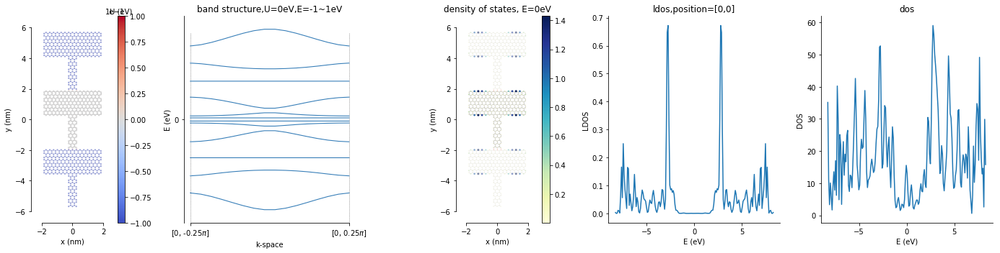

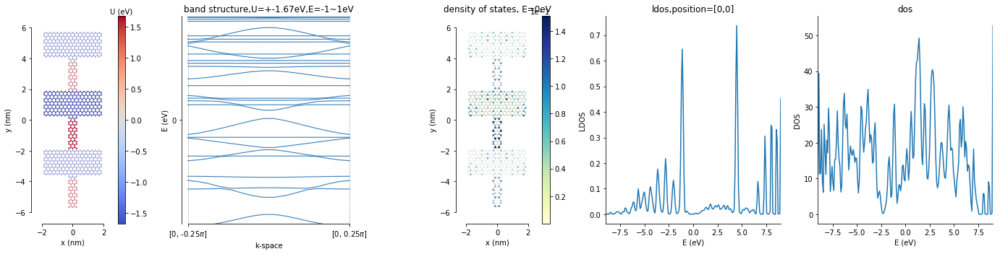

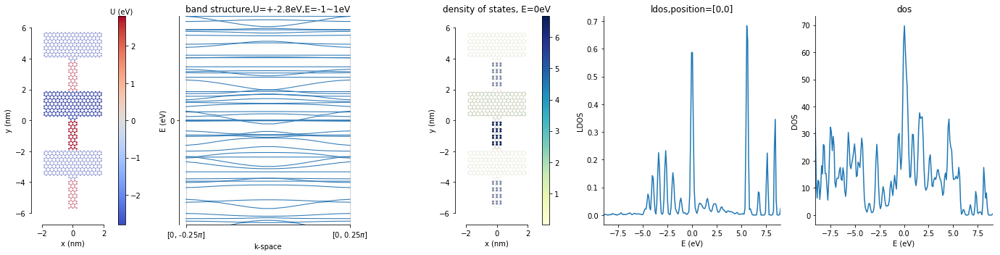

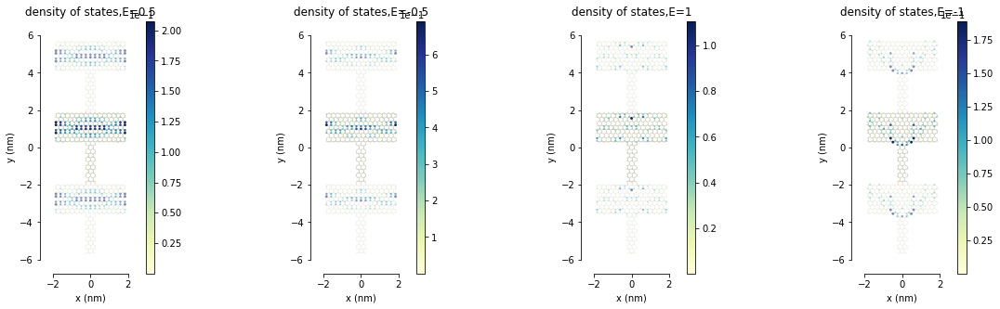

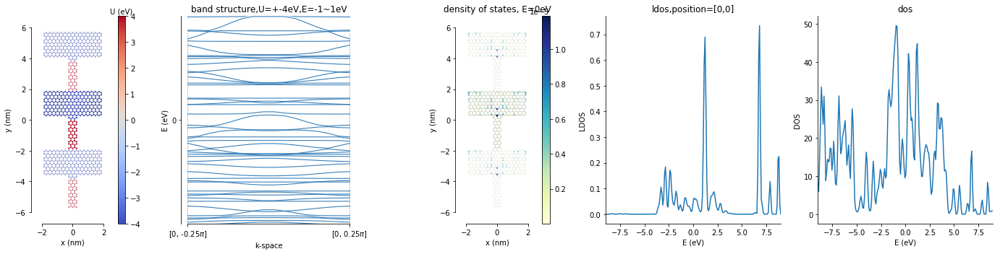

In [16]:
model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,
               pnjunctiony(delta=0,y0=0)
               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=0eV')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()


model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,
               pnjunctiony(delta=1.67,y0=0)
               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.67eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=0eV')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,
               pnjunctiony(delta=2.8,y0=0)
               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-2.8eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=0eV')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

plt.subplot(141)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0.5')
pb.pltutils.colorbar()
plt.subplot(142)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-0.5')
pb.pltutils.colorbar()
plt.subplot(143)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=1')
pb.pltutils.colorbar()
plt.subplot(144)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-1')
pb.pltutils.colorbar()
plt.show()

model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,
               pnjunctiony(delta=4,y0=0)
               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(151)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-4eV,E=-1~1eV')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=0eV')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')

plt.tight_layout()
plt.show()

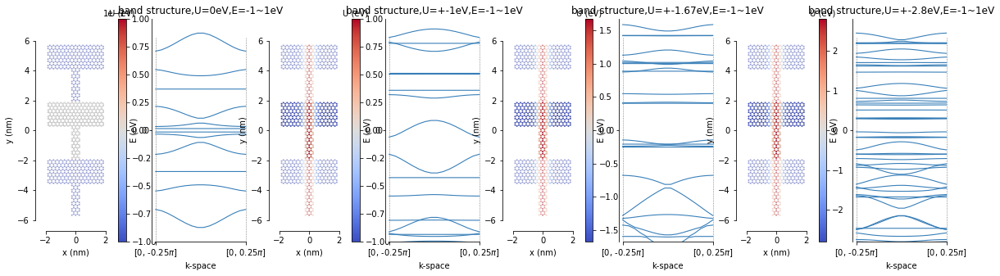

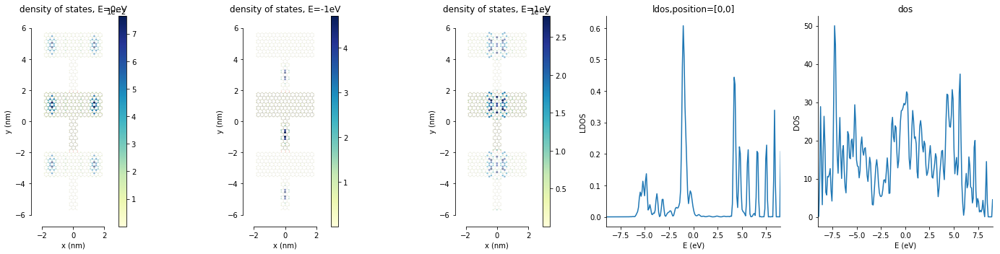

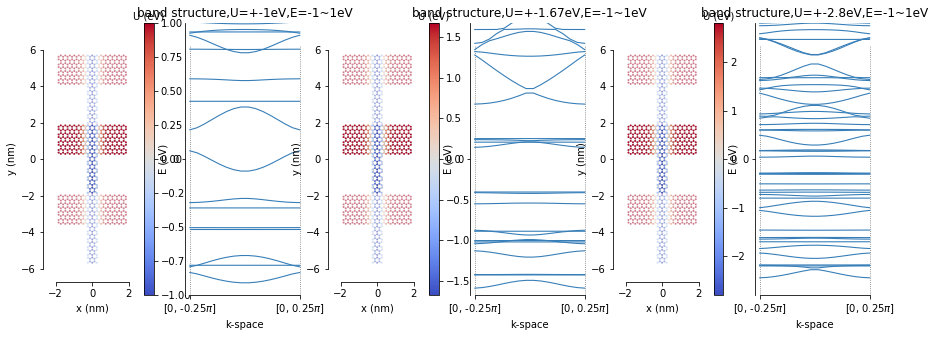

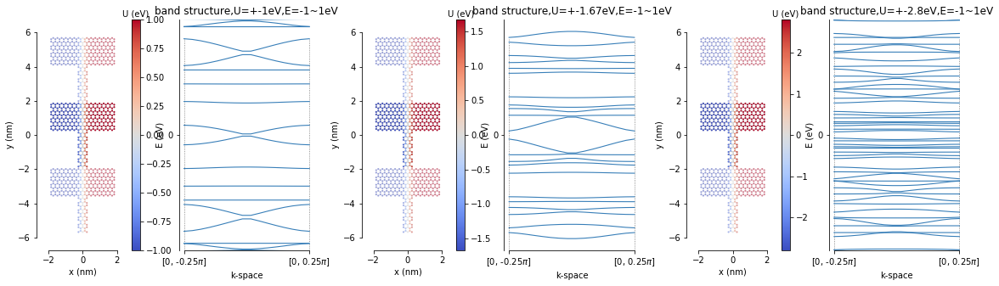

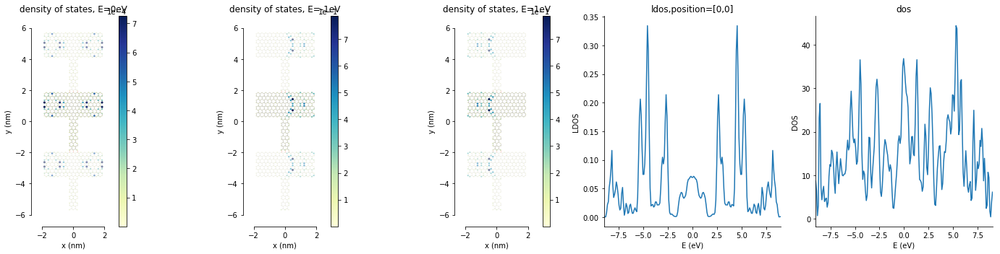

In [23]:
model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,
               pnjunctiony(delta=0,y0=0)
               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(181)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(182)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV,E=-1~1eV')

model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,gaussianx(E=1,x0=0, width=a+0.3)

               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(183)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(184)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1eV,E=-1~1eV')

model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,gaussianx(E=1.67,x0=0, width=a+0.3)

               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(185)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(186)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.67eV,E=-1~1eV')

model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,gaussianx(E=2.8,x0=0, width=a+0.3)

               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(187)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(188)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()

plt.ylim(-1,1)
plt.title('band structure,U=+-2.8eV,E=-1~1eV')
plt.show()
plt.subplot(151)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=0eV')
pb.pltutils.colorbar()
plt.subplot(152)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=-1eV')
pb.pltutils.colorbar()
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=1eV')
pb.pltutils.colorbar()



plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')

plt.tight_layout()
plt.show()




plt.show()

model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,gaussianx(E=-1,x0=0, width=a+0.3)

               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(181)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(182)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1eV,E=-1~1eV')

model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,gaussianx(E=-1.67,x0=0, width=a+0.3)

               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(183)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(184)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.67eV,E=-1~1eV')

model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,gaussianx(E=-2.8,x0=0, width=a+0.3)

               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(185)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(186)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-2.8eV,E=-1~1eV')
plt.show()

model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,tanhx(E=1,x0=0,w=5)
               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(161)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(162)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1eV,E=-1~1eV')

model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,tanhx(E=1.67,x0=0,w=5)

               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(163)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(164)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-1.67eV,E=-1~1eV')

model=pb.Model(middle4atom(),
               pb.Polygon([[-1*a,-2.1],[0.3,-2.1],[0.3,1.1*a_cc],[-1*a,1.1*a_cc]])+pb.Polygon([[-2+a/2,1.1*a_cc],[2-a/2,1.1*a_cc],[2-a/2,2+a_cc],[-2+a/2,2+a_cc]])
               
               ,tanhx(E=2.8,x0=0,w=5)

               ,
               pb.translational_symmetry(a1=False,a2=4)
               )
plt.subplot(165)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(166)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/4],[0,np.pi/4])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-2.8eV,E=-1~1eV')



plt.show()
plt.subplot(151)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=0eV')
pb.pltutils.colorbar()
plt.subplot(152)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=-1eV')
pb.pltutils.colorbar()
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states, E=1eV')
pb.pltutils.colorbar()



plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')

plt.tight_layout()
plt.show()



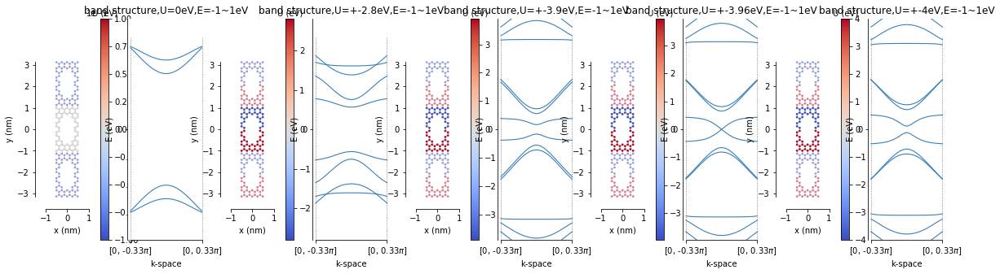

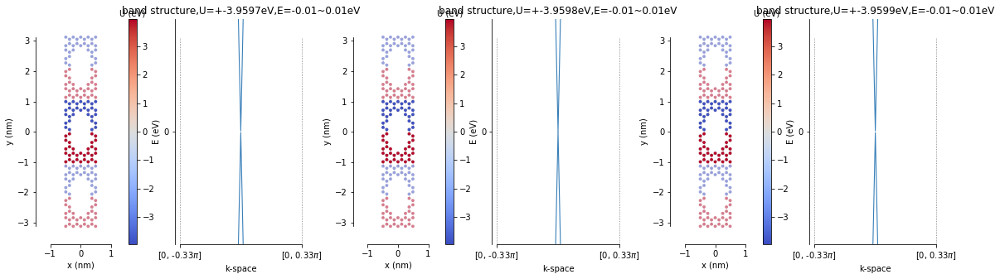

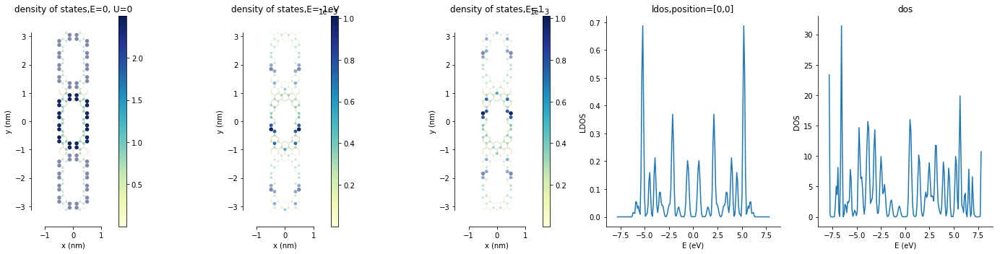

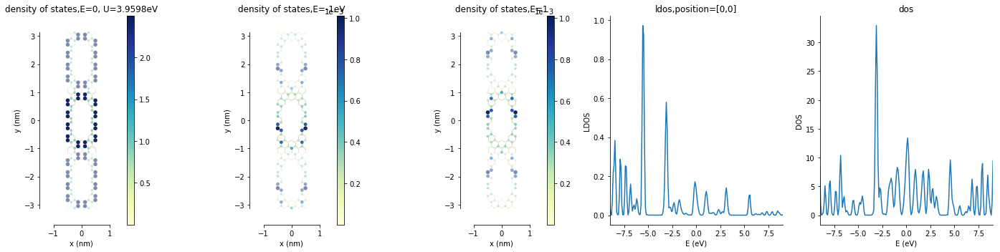

In [73]:
model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1)
               ,pnjunctiony(delta=0, y0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))
#3.67
plt.subplot(1,10,1)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,10,2)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV,E=-1~1eV')

model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1),
               pnjunctiony(delta=2.8, y0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(1,10,3)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,10,4)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-2.8eV,E=-1~1eV')

model=pb.Model(middle4atom(),
               pnjunctiony(delta=3.9, y0=0),
              pb.rectangle(1,3)-pb.rectangle(0.5,1)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(1,10,5)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,10,6)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-3.9eV,E=-1~1eV')

model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1),
               pnjunctiony(delta=3.96, y0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(1,10,7)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,10,8)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-3.96eV,E=-1~1eV')

model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1)
               ,pnjunctiony(delta=4, y0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(1,10,9)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,10,10)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-4eV,E=-1~1eV')



plt.show()
# 3.9598
model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1)
               ,pnjunctiony(delta=3.9597, y0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))
#3.67
plt.subplot(1,6,1)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,6,2)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-0.01,0.01)
plt.title('band structure,U=+-3.9597eV,E=-0.01~0.01eV')

model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1),
               pnjunctiony(delta=3.9598, y0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(1,6,3)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,6,4)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-0.01,0.01)
plt.title('band structure,U=+-3.9598eV,E=-0.01~0.01eV')

model=pb.Model(middle4atom(),
               pnjunctiony(delta=3.9599, y0=0),
              pb.rectangle(1,3)-pb.rectangle(0.5,1)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(1,6,5)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,6,6)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-0.01,0.01)
plt.title('band structure,U=+-3.9599eV,E=-0.01~0.01eV')




plt.show()
model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1),
               pnjunctiony(delta=0, y0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(151)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0, U=0')
pb.pltutils.colorbar()
plt.subplot(152)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-1eV')
pb.pltutils.colorbar()
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=1')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1),
               pnjunctiony(delta=3.9598, y0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(151)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0, U=3.9598eV')
pb.pltutils.colorbar()
plt.subplot(152)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-1eV')
pb.pltutils.colorbar()
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=1')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

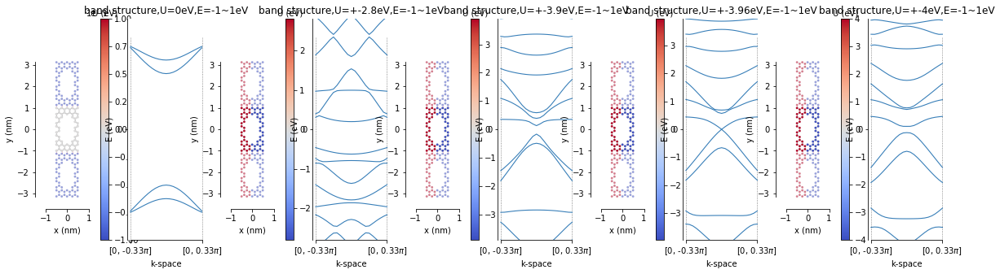

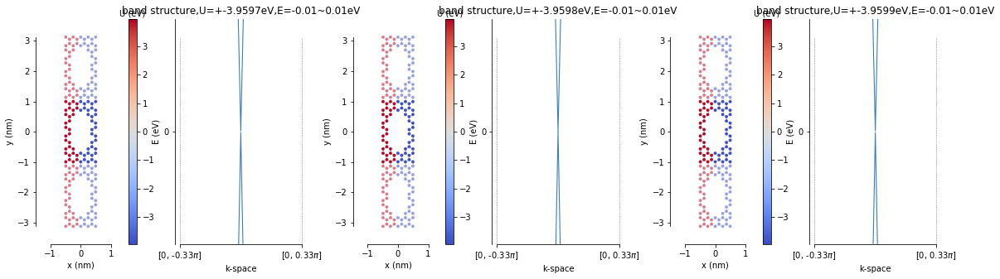

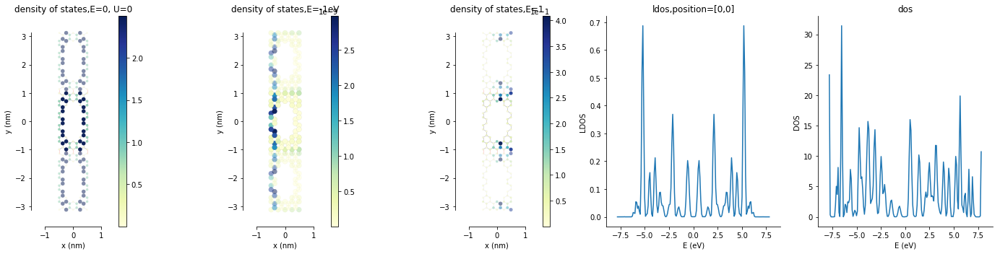

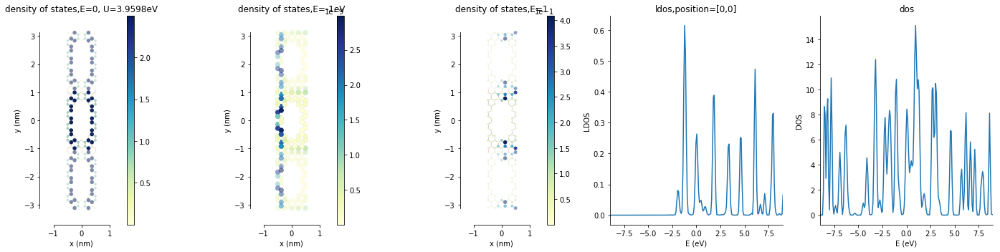

In [76]:
model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1)
               ,pnjunctiony(delta=0, y0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))
#3.67
plt.subplot(1,10,1)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,10,2)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=0eV,E=-1~1eV')

model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1),
               pnjunctionx(delta=2.8, x0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(1,10,3)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,10,4)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-2.8eV,E=-1~1eV')

model=pb.Model(middle4atom(),
               pnjunctionx(delta=3.9, x0=0),
              pb.rectangle(1,3)-pb.rectangle(0.5,1)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(1,10,5)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,10,6)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-3.9eV,E=-1~1eV')

model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1),
               pnjunctionx(delta=3.96, x0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(1,10,7)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,10,8)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-3.96eV,E=-1~1eV')

model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1)
               ,pnjunctionx(delta=4, x0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(1,10,9)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,10,10)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-1,1)
plt.title('band structure,U=+-4eV,E=-1~1eV')



plt.show()

model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1)
               ,pnjunctionx(delta=3.9597, x0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))
#3.67
plt.subplot(1,6,1)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,6,2)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-0.01,0.01)
plt.title('band structure,U=+-3.9597eV,E=-0.01~0.01eV')

model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1),
               pnjunctionx(delta=3.9598, x0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(1,6,3)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,6,4)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-0.01,0.01)
plt.title('band structure,U=+-3.9598eV,E=-0.01~0.01eV')

model=pb.Model(middle4atom(),
               pnjunctionx(delta=3.9599, x0=0),
              pb.rectangle(1,3)-pb.rectangle(0.5,1)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(1,6,5)
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(1,6,6)
solver=pb.solver.lapack(model)
band=solver.calc_bands([0,-np.pi/3],[0,np.pi/3])
band.plot()
plt.ylim(-0.01,0.01)
plt.title('band structure,U=+-3.9599eV,E=-0.01~0.01eV')




plt.show()
model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1),
               pnjunctionx(delta=0, x0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(151)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0, U=0')
pb.pltutils.colorbar()
plt.subplot(152)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-1eV')
pb.pltutils.colorbar()
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=1')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

model=pb.Model(middle4atom(),
              pb.rectangle(1,3)-pb.rectangle(0.5,1),
               pnjunctionx(delta=3.9598, x0=0)
              ,pb.translational_symmetry(a1=False, a2=2+a))

plt.subplot(151)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0, U=3.9598eV')
pb.pltutils.colorbar()
plt.subplot(152)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-1eV')
pb.pltutils.colorbar()
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=1')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.tight_layout()
plt.show()

# gaussian shaped potential( smooth junction)

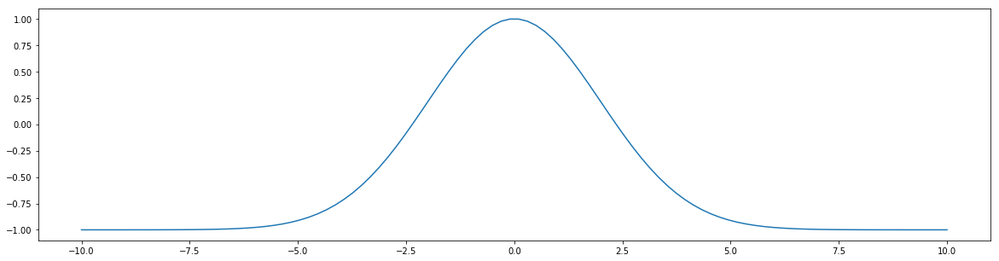

In [78]:
x=np.linspace(-10,10,100)
E=1
y0=0
sigma=2
plt.plot(x,2*E*(np.exp(-((x-y0)**2)/(2*sigma**2))-0.5))
plt.show()

# smooth squre well(tanh)

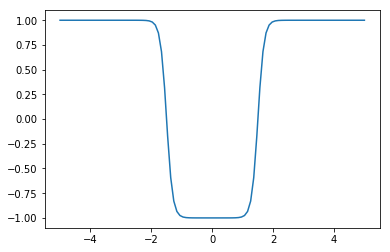

In [10]:
y=np.linspace(-5,5,100)
E=1
y0=0
w=3
A=5
plt.plot(y,E*(np.exp(A*(np.abs(y-y0)-w/2))-np.exp(-A*(np.abs(y-y0)-w/2)))/(np.exp(A*(np.abs(y-y0)-w/2))+np.exp(-A*(np.abs(y-y0)-w/2))))
plt.show()

# potential well

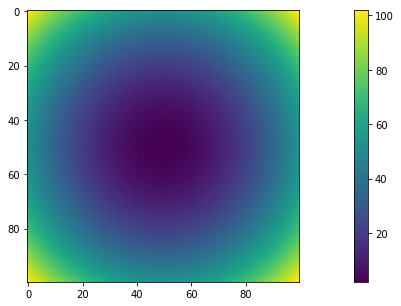

In [92]:
x=np.linspace(-5,5,100)
y=np.linspace(-5,5,100)
xg,yg=np.meshgrid(x,y)
A=2
xc=1
yc=1
x0=0
y0=0
b=-1

plt.imshow(A*(xc*(xg-x0)**2+yc*(yg-y0)**2-b))
plt.colorbar()

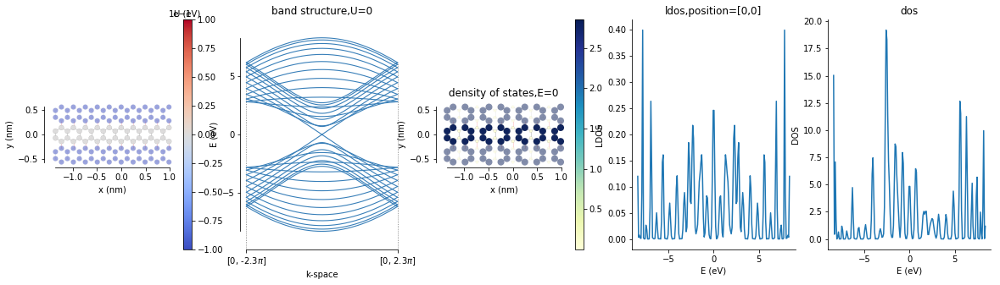

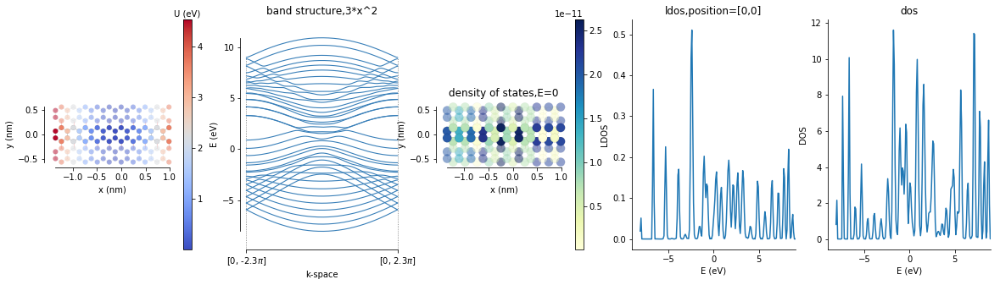

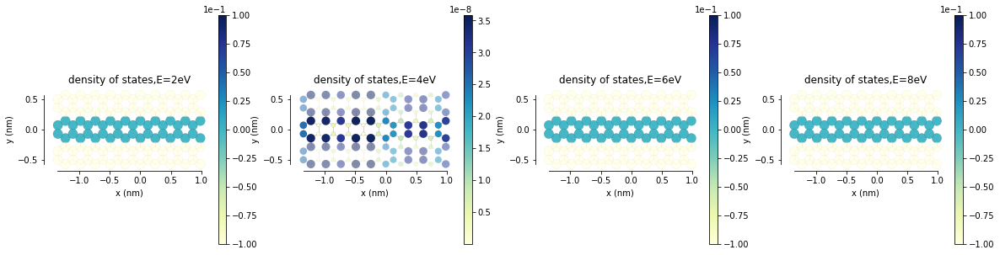

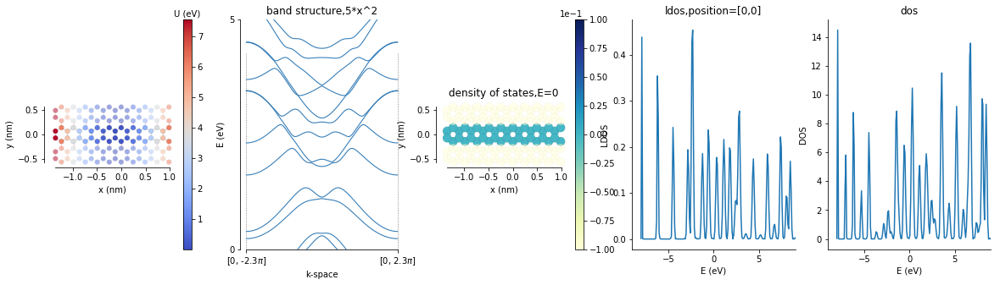

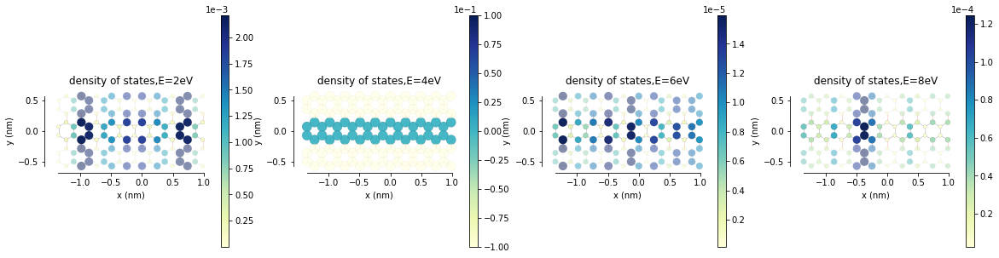

In [38]:
plt.rcParams["figure.figsize"] = (20,5)


plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.primitive(a1=10),
               pnjunctiony(delta=0,y0=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.title('band structure,U=0')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()


plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.primitive(a1=10),
               potentialwell(A=3,xc=1,x0=-a/2,yc=0,y0=0,b=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.title('band structure,3*x^2')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()
plt.subplot(141)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=2, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=2eV')
pb.pltutils.colorbar()

plt.subplot(142)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=4, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=4eV')
pb.pltutils.colorbar()

plt.subplot(143)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=6, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=6eV')
pb.pltutils.colorbar()

plt.subplot(144)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=8, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=8eV')
pb.pltutils.colorbar()

plt.show()


plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.primitive(a1=10),
               potentialwell(A=5,xc=1,x0=-a/2,yc=0,y0=0,b=0)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.ylim(0,5)
plt.title('band structure,5*x^2')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

plt.subplot(141)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=2, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=2eV')
pb.pltutils.colorbar()

plt.subplot(142)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=4, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=4eV')
pb.pltutils.colorbar()

plt.subplot(143)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=6, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=6eV')
pb.pltutils.colorbar()

plt.subplot(144)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=8, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=8eV')
pb.pltutils.colorbar()

plt.show()


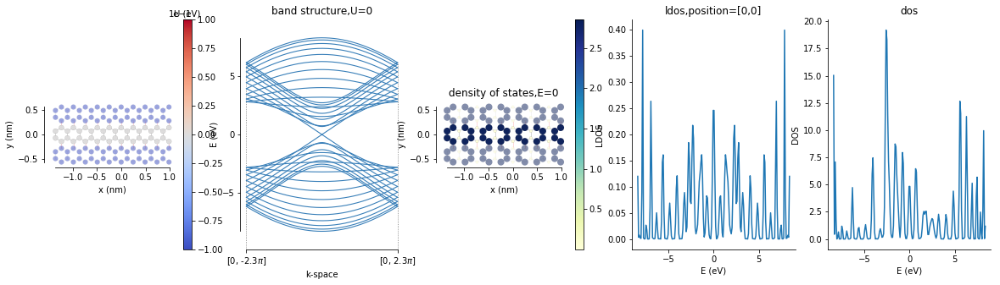

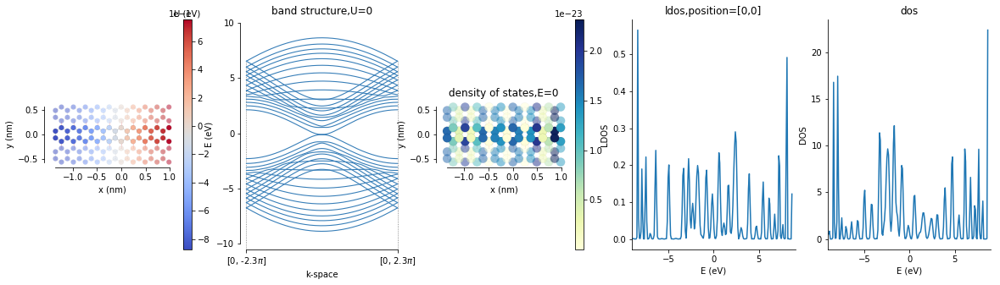

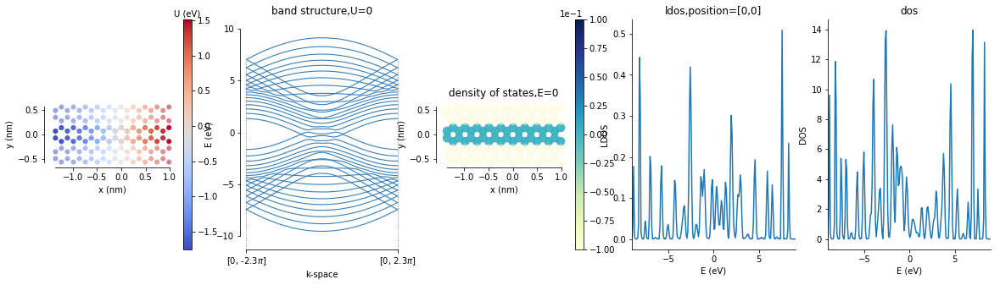

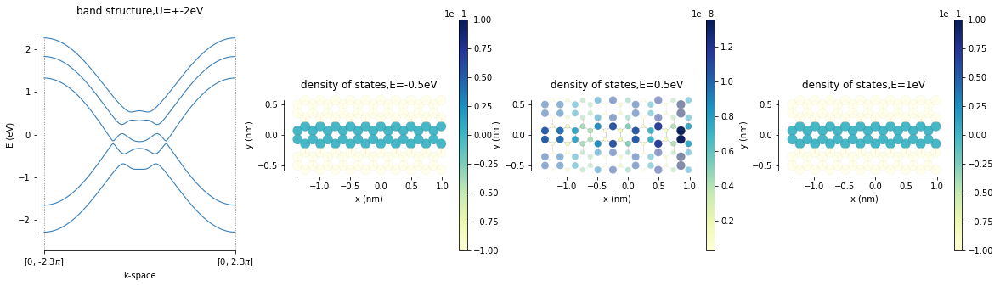

In [39]:

plt.rcParams["figure.figsize"] = (20,5)
plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.primitive(a1=10),
               tanhx(E=0,x0=0,w=1)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.title('band structure,U=0')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()


plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.primitive(a1=10),
               tanhx(E=1,x0=0,w=1)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.title('band structure,U=0')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.primitive(a1=10),
               tanhx(E=2,x0=0,w=1)
               ,
               pb.translational_symmetry(a1=False, a2=0.1)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.title('band structure,U=0')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos,position=[0,0]')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

plt.subplot(141)
solver=pb.solver.arpack(model,k=5)
band=solver.calc_bands(k1,k2)
band.plot()
plt.title('band structure,U=+-2eV')

plt.subplot(142)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=-0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=-0.5eV')
pb.pltutils.colorbar()

plt.subplot(143)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0.5, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=0.5eV')
pb.pltutils.colorbar()

plt.subplot(144)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=1, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states,E=1eV')
pb.pltutils.colorbar()

plt.show()



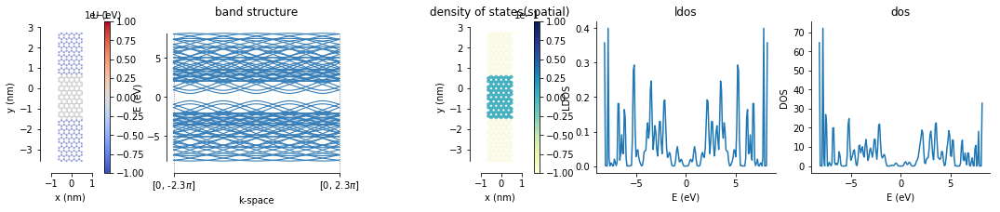

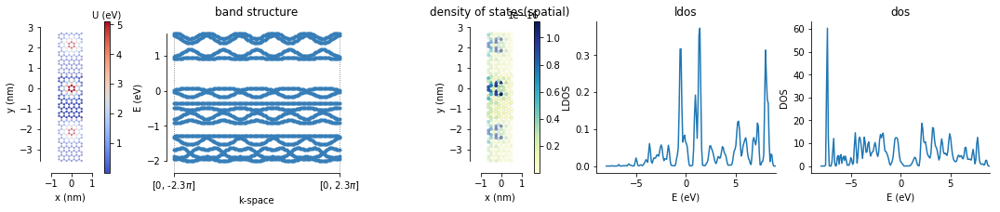

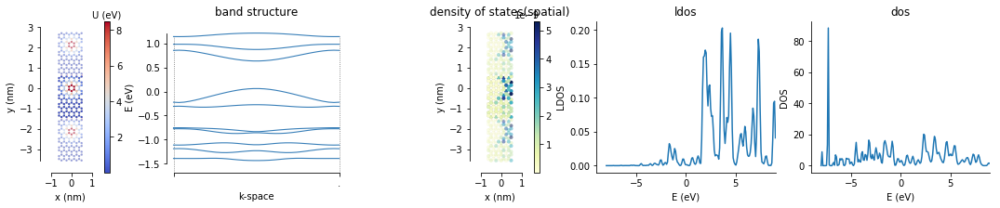

In [40]:
plt.rcParams["figure.figsize"] = (20,3)


plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.primitive(a1=5,a2=10),
               gaussianwell(E=0,x0=0,y0=0,width=0.5)
               ,
               pb.translational_symmetry(a1=False, a2=2)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.lapack(model)
band=solver.calc_bands(k1,k2)
band.plot()
plt.title('band structure')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states(spatial)')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.primitive(a1=5,a2=10),
               gaussianwell(E=3,x0=0,y0=0,width=0.5)
               ,
               pb.translational_symmetry(a1=False, a2=2)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.arpack(model,k=15)
band=solver.calc_bands(k1,k2)
band.plot(marker='.')
plt.title('band structure')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states(spatial)')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.primitive(a1=5,a2=10),
               gaussianwell(E=5,x0=0,y0=0,width=0.5)
               ,
               pb.translational_symmetry(a1=False, a2=2)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.arpack(model,k=10)
band=solver.calc_bands([0,np.pi/2],[0,-np.pi/2])
band.plot('.',markersize=0.5)
plt.title('band structure')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states(spatial)')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

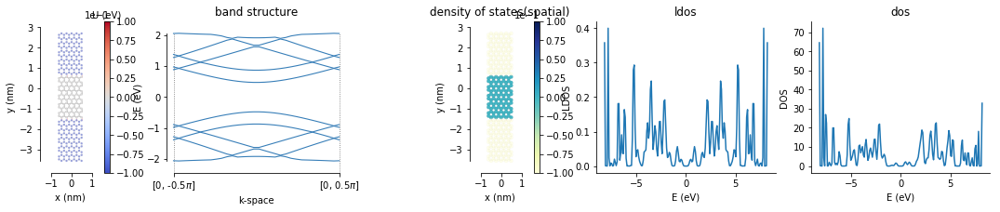

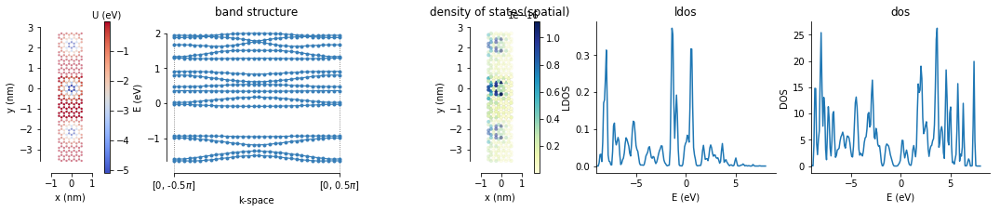

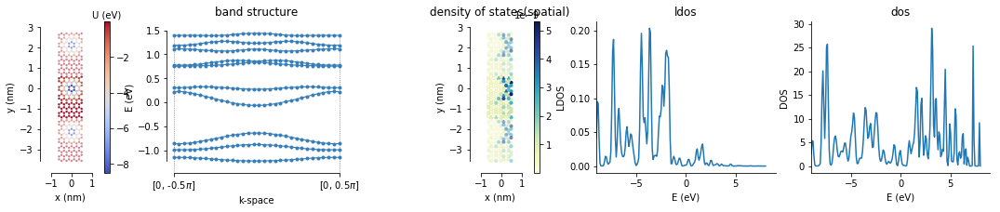

In [42]:
plt.rcParams["figure.figsize"] = (20,3)


plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.primitive(a1=5,a2=10),
               gaussianwell(E=0,x0=0,y0=0,width=0.5)
               ,
               pb.translational_symmetry(a1=False, a2=2)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.arpack(model,k=10)
band=solver.calc_bands([0,np.pi/2],[0,-np.pi/2])
band.plot()
plt.title('band structure')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states(spatial)')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.primitive(a1=5,a2=10),
               gaussianwell(E=-3,x0=0,y0=0,width=0.5)
               ,
               pb.translational_symmetry(a1=False, a2=2)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.arpack(model,k=15)
band=solver.calc_bands([0,np.pi/2],[0,-np.pi/2])
band.plot(marker='.')
plt.title('band structure')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states(spatial)')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')
plt.show()

plt.subplot(151)
model=pb.Model(middle4atom(),
               pb.primitive(a1=5,a2=10),
               gaussianwell(E=-5,x0=0,y0=0,width=0.5)
               ,
               pb.translational_symmetry(a1=False, a2=2)
               )
model.onsite_map.plot(cmap="coolwarm", site_radius=0.04)
pb.pltutils.colorbar(label="U (eV)")
plt.subplot(152)
solver=pb.solver.arpack(model,k=10)
band=solver.calc_bands([0,np.pi/2],[0,-np.pi/2])
band.plot(marker='.')
plt.title('band structure')
plt.subplot(153)
solver.set_wave_vector(k=1)
ldos = solver.calc_spatial_ldos(energy=0, broadening=0.01) 
ldos.plot(site_radius=(0.03, 0.07))
plt.title('density of states(spatial)')
pb.pltutils.colorbar()

plt.subplot(154)
kpm = pb.kpm(model)
ldos = kpm.calc_ldos(energy=np.linspace(-9, 9, 200), broadening=0.11, position=[0,0])
ldos.plot()
plt.title('ldos')
plt.subplot(155)
kpm = pb.kpm(model)
dos = kpm.calc_dos(energy=np.linspace(-9, 9, 200), broadening=0.11)
dos.plot()
plt.title('dos')

plt.show()